<a href="https://colab.research.google.com/github/ettoro/Analisi-stilistica-computazionale-Class/blob/main/COLI_Class_Identifying_characters_(EN).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# All characters

## Preprocessing

In [1]:
!pip install spacy
!pip install lexicalrichness
!pip install textblob
!pip install nltk

  Created wheel for lexicalrichness: filename=lexicalrichness-0.1.3-py2.py3-none-any.whl size=8741 sha256=fd8032e7349087ea1b51260579148e845f7ab3ec6ad49a5901051e8bd9400e77
  Stored in directory: /root/.cache/pip/wheels/ac/04/68/c48c4001edf1647b80b549897fd80082286ec253e343c73116
Successfully built lexicalrichness


In [2]:
import pandas as pd
from pandas import DataFrame
import spacy
from spacy.lang.en import English
import numpy as np
import sklearn
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
from sklearn.dummy import DummyClassifier
import collections
from sklearn.model_selection import train_test_split
from pandas.plotting import parallel_coordinates
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn import metrics
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
from lexicalrichness import LexicalRichness
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import OneHotEncoder, StandardScaler
import nltk
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import cross_val_score
import en_core_web_sm
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn import svm
from collections import Counter
from keras.callbacks import TensorBoard
from matplotlib import pyplot
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE
from sklearn import preprocessing
from numpy import loadtxt
from keras.models import Sequential
from keras.layers import Dense
from keras.callbacks import Callback
from sklearn.metrics import confusion_matrix, f1_score, precision_score, recall_score

/usr/local/lib/python3.7/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


In [3]:
spacy_stopwords = spacy.lang.en.stop_words.STOP_WORDS
nlp = en_core_web_sm.load()

In [4]:
corpus = pd.read_csv('corpus-coli-project-wnone.tsv', sep='\t')
print(corpus)

        character                                               text
0     McCAFFERTY.                                             Hello?
1          BRIAN.                                             Hello.
2     McCAFFERTY.                                          Hello...?
3          BRIAN.                  CHARCHAR CHARCHAR. CHARCHAR's da?
4     McCAFFERTY.   Oh. Great. Come in, come in. You're very prompt.
...           ...                                                ...
1647        NONE.  CHARCHAR nods. He sees the psychologist's lett...
1648        NONE.                            CHARCHAR almost laughs.
1649        NONE.           CHARCHAR snaps the letter from his hand.
1650        NONE.                                   CHARCHAR leaves.
1651        NONE.      CHARCHAR looks around the classroom. The End.

[1652 rows x 2 columns]


In [5]:
#function to get the features needed

def getfeatures(corpus):
  
  tokens_nopunct = []
  lower = []
  lemma = []
  pos = []
  lemma_nopunct = []
  stopwords = []
  stopwords_words = []
  len_words = []
  sent_count = []
  dependency = []
  bigrams_ww = []
  trigrams_ww = []
  bigrams_pos = []
  trigrams_pos = []
  a= []
  typetoken_ratio = []
  
  for doc in nlp.pipe(corpus['text'].astype('unicode').values):
      if doc.is_parsed:
          tokens_nopunct.append([n.text for n in doc if n.is_punct != True])
          lower.append([n.lower_ for n in doc])
          lemma.append([n.lemma_ for n in doc])
          pos.append([n.pos_ for n in doc])
          lemma_nopunct.append([n.lemma_ for n in doc if n.is_punct != True])
          stopwords.append([n.is_stop == True for n in doc if n.is_punct != True])
          len_words.append([len(n) for n in doc])
          sent_count.append(len(list(doc.sents)))
          dependency.append([n.dep_ for n in doc])
      else:
          tokens_nopunct.append(None)
          lower.append(None)
          lemma.append(None)
          pos.append(None)
          lemma_nopunct.append(None)
          stopwords.append(None)
          len_words.append(None)
          sent_count.append(None)
          dependency.append(None)
          
  corpus['text_tokens_nopunct'] = tokens_nopunct
  corpus['text_lower'] = lower
  corpus['text_lemma'] = lemma
  corpus['text_pos'] = pos
  corpus['lemma_nopunct'] = lemma_nopunct
  corpus['stopwords'] = stopwords
  corpus['pos_count'] = corpus.text_pos.apply(lambda x: len(str(x).split(',')))
  corpus['stop_count'] = [sum(i) for i in corpus['stopwords']]
  corpus['len_words'] = len_words
  corpus['total_len_words'] = [sum(i) for i in corpus['len_words']]
  corpus['word_count'] = [len(i) for i in corpus['text_tokens_nopunct']]
  corpus['sent_count'] = sent_count
  corpus['prop_stopwords'] = corpus['stop_count'] / corpus['word_count']
  corpus['avg_word_length'] = corpus['total_len_words'] / corpus['word_count']
  corpus['avg_sent_length'] = corpus['word_count'] / corpus['sent_count']
  corpus['avg_sent_length_char'] = corpus['total_len_words'] / corpus['sent_count']
  corpus['dependency'] = dependency
  
  for doc in nlp.pipe(corpus['text_lower'].astype('unicode').values):
      if doc.is_parsed:
          stopwords_words.append([n for n in doc if n.is_stop == True])
      else:
          stopwords_words.append(None)
  corpus['stopwords_words'] = stopwords_words

  for line in corpus['text_pos']:
    bigrams_pos.append(list(nltk.bigrams(line)))
  corpus['bigrams_pos'] = bigrams_pos

  for line in corpus['text_pos']:
    if len(line) > 2:
      trigrams_pos.append(list(nltk.trigrams(line)))
    if len(line) <= 2:
      trigrams_pos.append(a)
  corpus['trigrams_pos'] = trigrams_pos

  for line in corpus['lemma_nopunct']:
      linetext = " ".join(str(x) for x in line)
      lexrich_line = LexicalRichness(linetext)
      typetoken_ratio.append(lexrich_line.ttr)  

  corpus['typetoken_ratio'] = typetoken_ratio

In [6]:
getfeatures(corpus)
pd.set_option('display.max_columns', None)

In [7]:
corpus

,character,text,text_tokens_nopunct,text_lower,text_lemma,text_pos,lemma_nopunct,stopwords,pos_count,stop_count,len_words,total_len_words,word_count,sent_count,prop_stopwords,avg_word_length,avg_sent_length,avg_sent_length_char,dependency,stopwords_words,bigrams_pos,trigrams_pos,typetoken_ratio
0,McCAFFERTY.,Hello?,[Hello],"[hello, ?]","[hello, ?]","[INTJ, PUNCT]",[hello],[False],2,0,"[5, 1]",6,1,1,0.000000,6.000000,1.0,6.000000,"[ROOT, punct]",[],"[(INTJ, PUNCT)]",[],1.000000
1,BRIAN.,Hello.,[Hello],"[hello, .]","[hello, .]","[INTJ, PUNCT]",[hello],[False],2,0,"[5, 1]",6,1,1,0.000000,6.000000,1.0,6.000000,"[ROOT, punct]",[],"[(INTJ, PUNCT)]",[],1.000000
2,McCAFFERTY.,Hello...?,[Hello],"[hello, ..., ?]","[hello, ..., ?]","[INTJ, PUNCT, PUNCT]",[hello],[False],3,0,"[5, 3, 1]",9,1,1,0.000000,9.000000,1.0,9.000000,"[ROOT, punct, punct]",[],"[(INTJ, PUNCT), (PUNCT, PUNCT)]","[(INTJ, PUNCT, PUNCT)]",1.000000
3,BRIAN.,CHARCHAR CHARCHAR. CHARCHAR's da?,"[CHARCHAR, CHARCHAR, CHARCHAR, 's, da]","[charchar, charchar, ., charchar, 's, da, ?]","[CHARCHAR, CHARCHAR, ., CHARCHAR, 's, da, ?]","[PROPN, PROPN, PUNCT, PROPN, PART, NOUN, PUNCT]","[CHARCHAR, CHARCHAR, CHARCHAR, 's, da]","[False, False, False, True, False]",7,1,"[8, 8, 1, 8, 2, 2, 1]",30,5,2,0.200000,6.000000,2.5,15.000000,"[compound, ROOT, punct, poss, case, ROOT, punct]",['s],"[(PROPN, PROPN), (PROPN, PUNCT), (PUNCT, PROPN...","[(PROPN, PROPN, PUNCT), (PROPN, PUNCT, PROPN),...",0.600000
4,McCAFFERTY.,"Oh. Great. Come in, come in. You're very prompt.","[Oh, Great, Come, in, come, in, You, 're, very...","[oh, ., great, ., come, in, ,, come, in, ., yo...","[oh, ., great, ., come, in, ,, come, in, ., -P...","[INTJ, PUNCT, ADJ, PUNCT, VERB, ADP, PUNCT, VE...","[oh, great, come, in, come, in, -PRON-, be, ve...","[False, False, False, True, False, True, True,...",15,5,"[2, 1, 5, 1, 4, 2, 1, 4, 2, 1, 3, 3, 4, 6, 1]",40,10,4,0.500000,4.000000,2.5,10.000000,"[ROOT, punct, ROOT, punct, ROOT, prt, punct, c...","[in, in, you, 're, very]","[(INTJ, PUNCT), (PUNCT, ADJ), (ADJ, PUNCT), (P...","[(INTJ, PUNCT, ADJ), (PUNCT, ADJ, PUNCT), (ADJ...",0.800000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1647,NONE.,CHARCHAR nods. He sees the psychologist's lett...,"[CHARCHAR, nods, He, sees, the, psychologist, ...","[charchar, nods, ., he, sees, the, psychologis...","[CHARCHAR, nod, ., -PRON-, see, the, psycholog...","[VERB, NOUN, PUNCT, PRON, VERB, DET, NOUN, PAR...","[CHARCHAR, nod, -PRON-, see, the, psychologist...","[False, False, True, False, True, False, True,...",15,6,"[8, 4, 1, 2, 4, 3, 12, 2, 6, 1, 2, 5, 2, 2, 1]",55,12,3,0.500000,4.583333,4.0,18.333333,"[compound, ROOT, punct, nsubj, ROOT, det, poss...","[he, the, 's, he, it, up]","[(VERB, NOUN), (NOUN, PUNCT), (PUNCT, PRON), (...","[(VERB, NOUN, PUNCT), (NOUN, PUNCT, PRON), (PU...",0.833333
1648,NONE.,CHARCHAR almost laughs.,"[CHARCHAR, almost, laughs]","[charchar, almost, laughs, .]","[CHARCHAR, almost, laugh, .]","[PROPN, ADV, VERB, PUNCT]","[CHARCHAR, almost, laugh]","[False, True, False]",4,1,"[8, 6, 6, 1]",21,3,1,0.333333,7.000000,3.0,21.000000,"[nsubj, advmod, ROOT, punct]",[almost],"[(PROPN, ADV), (ADV, VERB), (VERB, PUNCT)]","[(PROPN, ADV, VERB), (ADV, VERB, PUNCT)]",1.000000
1649,NONE.,CHARCHAR snaps the letter from his hand.,"[CHARCHAR, snaps, the, letter, from, his, hand]","[charchar, snaps, the, letter, from, his, hand...","[CHARCHAR, snap, the, letter, from, -PRON-, ha...","[PROPN, NOUN, DET, NOUN, ADP, DET, NOUN, PUNCT]","[CHARCHAR, snap, the, letter, from, -PRON-, hand]","[False, False, True, False, True, True, False]",8,3,"[8, 5, 3, 6, 4, 3, 4, 1]",34,7,1,0.428571,4.857143,7.0,34.000000,"[nsubj, ROOT, det, dobj, prep, poss, pobj, punct]","[the, from, his]","[(PROPN, NOUN), (NOUN, DET), (DET, NOUN), (NOU...","[(PROPN, NOUN, DET), (NOUN, DET, NOUN), (DET, ...",1.000000
1650,NONE.,CHARCHAR leaves.,"[CHARCHAR, leaves]","[charchar, leaves, .]","[CHARCHAR, leave, .]","[PROPN, NOUN, 

In [8]:
important_features = corpus[['character', 'avg_word_length', 'avg_sent_length', 'avg_sent_length_char', 'prop_stopwords', 'typetoken_ratio', 'text_pos', 'bigrams_pos', 'trigrams_pos']].copy()
important_features.head()

,character,avg_word_length,avg_sent_length,avg_sent_length_char,prop_stopwords,typetoken_ratio,text_pos,bigrams_pos,trigrams_pos
0,McCAFFERTY.,6.0,1.0,6.0,0.0,1.0,"[INTJ, PUNCT]","[(INTJ, PUNCT)]",[]
1,BRIAN.,6.0,1.0,6.0,0.0,1.0,"[INTJ, PUNCT]","[(INTJ, PUNCT)]",[]
2,McCAFFERTY.,9.0,1.0,9.0,0.0,1.0,"[INTJ, PUNCT, PUNCT]","[(INTJ, PUNCT), (PUNCT, PUNCT)]","[(INTJ, PUNCT, PUNCT)]"
3,BRIAN.,6.0,2.5,15.0,0.2,0.6,"[PROPN, PROPN, PUNCT, PROPN, PART, NOUN, PUNCT]","[(PROPN, PROPN), (PROPN, PUNCT), (PUNCT, PROPN...","[(PROPN, PROPN, PUNCT), (PROPN, PUNCT, PROPN),..."
4,McCAFFERTY.,4.0,2.5,10.0,0.5,0.8,"[INTJ, PUNCT, ADJ, PUNCT, VERB, ADP, PUNCT, VE...","[(INTJ, PUNCT), (PUNCT, ADJ), (ADJ, PUNCT), (P...","[(INTJ, PUNCT, ADJ), (PUNCT, ADJ, PUNCT), (ADJ..."


In [9]:
# function to transform string-type pos
# (this is the step I'm less sure about the whole project. In this way, a lot of features are created,
# still it performs better than without pos)

mlb = MultiLabelBinarizer()
important_features = important_features.join(pd.DataFrame(mlb.fit_transform(important_features.pop('text_pos')),
                          columns=mlb.classes_,
                          index=important_features.index))

important_features = important_features.join(pd.DataFrame(mlb.fit_transform(important_features.pop('bigrams_pos')),
                          columns=mlb.classes_,
                          index=important_features.index))

important_features = important_features.join(pd.DataFrame(mlb.fit_transform(important_features.pop('trigrams_pos')),
                          columns=mlb.classes_,
                          index=important_features.index))

In [10]:
important_features

character  avg_word_length  avg_sent_length  avg_sent_length_char  \
0     McCAFFERTY.         6.000000              1.0              6.000000   
1          BRIAN.         6.000000              1.0              6.000000   
2     McCAFFERTY.         9.000000              1.0              9.000000   
3          BRIAN.         6.000000              2.5             15.000000   
4     McCAFFERTY.         4.000000              2.5             10.000000   
...           ...              ...              ...                   ...   
1647        NONE.         4.583333              4.0             18.333333   
1648        NONE.         7.000000              3.0             21.000000   
1649        NONE.         4.857143              7.0             34.000000   
1650        NONE.         7.500000              2.0             15.000000   
1651        NONE.         5.571429              3.5             19.500000   

      prop_stopwords  typetoken_ratio  ADJ  ADP  ADV  AUX  CCONJ  DET  INTJ  \
0           0.000000         1.000000    0    0    0    0      0    0     1   
1           0.000000         1.000000    0    0    0    0      0    0     1   
2           0.000000         1.000000    0    0    0    0      0    0     1   
3           0.200000         0.600000    0    0    0    0      0    0     0   
4           0.500000         0.800000    1    1    1    1      0    0     1   
...              ...              ...  ...  ...  ...  ...    ...  ...   ...   
1647        0.500000         0.833333    0    1    0    0      0    1     0   
1648        0.333333         1.000000    0    0    1    0      0    0     0   
1649        0.428571         1.000000    0    1    0    0      0    1     0   
1650        0.000000         1.000000    0    0    0    0      0    0     0   
1651        0.428571         0.857143    0    1    0    0      0    1     0   

      NOUN  NUM  PART  PRON  PROPN  PUNCT  SCONJ  SPACE  SYM  VERB  X  \
0        0    0     0     0      0      1      0      0    0     0  0   
1        0    0     0     0      0      1      0      0    0     0  0   
2        0    0     0     0      0      1      0      0    0     0  0   
3        1    0     1     0      1      1      0      0    0     0  0   
4        0    0     0     1      0      1      0      0    0     1  0   
...    ...  ...   ...   ...    ...    ...    ...    ...  ...   ... ..   
1647     1    0     1     1      0      1      0      0    0     1  0   
1648     0    0     0     0      1      1      0      0    0     1  0   
1649     1    0     0     0      1      1      0      0    0     0  0   
1650     1    0     0     0      1      1      0      0    0     0  0   
1651     1    0     0     0      1      1      0      0    0     1  0   

      (ADJ, ADJ)  (ADJ, ADP)  (ADJ, ADV)  (ADJ, AUX)  (ADJ, CCONJ)  \
0              0           0           0           0             0   
1              0           0           0           0             0   
2              0           0           0           0             0   
3              0           0           0           0             0   
4              0           0           0           0             0   
...          ...         ...         ...         ...           ...   
1647           0           0           0           0             0   
1648           0           0           0           0             0   
1649           0           0           0           0             0   
1650           0           0           0           0             0   
1651           0           0           0           0             0   

      (ADJ, DET)  (ADJ, NOUN)  (ADJ, NUM)  (ADJ, PART)  (ADJ, PRON)  \
0              0            0           0            0            0   
1              0            0           0            0            0   
2              0            0           0            0            0   
3              0            0           0            0            0   
4              0            0           0            0       

In [11]:
features = important_features.drop(['character'],axis=1)
# features = features[features.columns[features.sum()>10]]
features['character'] = important_features['character']
features

avg_word_length  avg_sent_length  avg_sent_length_char  prop_stopwords  \
0            6.000000              1.0              6.000000        0.000000   
1            6.000000              1.0              6.000000        0.000000   
2            9.000000              1.0              9.000000        0.000000   
3            6.000000              2.5             15.000000        0.200000   
4            4.000000              2.5             10.000000        0.500000   
...               ...              ...                   ...             ...   
1647         4.583333              4.0             18.333333        0.500000   
1648         7.000000              3.0             21.000000        0.333333   
1649         4.857143              7.0             34.000000        0.428571   
1650         7.500000              2.0             15.000000        0.000000   
1651         5.571429              3.5             19.500000        0.428571   

      typetoken_ratio  ADJ  ADP  ADV  AUX  CCONJ  DET  INTJ  NOUN  NUM  PART  \
0            1.000000    0    0    0    0      0    0     1     0    0     0   
1            1.000000    0    0    0    0      0    0     1     0    0     0   
2            1.000000    0    0    0    0      0    0     1     0    0     0   
3            0.600000    0    0    0    0      0    0     0     1    0     1   
4            0.800000    1    1    1    1      0    0     1     0    0     0   
...               ...  ...  ...  ...  ...    ...  ...   ...   ...  ...   ...   
1647         0.833333    0    1    0    0      0    1     0     1    0     1   
1648         1.000000    0    0    1    0      0    0     0     0    0     0   
1649         1.000000    0    1    0    0      0    1     0     1    0     0   
1650         1.000000    0    0    0    0      0    0     0     1    0     0   
1651         0.857143    0    1    0    0      0    1     0     1    0     0   

      PRON  PROPN  PUNCT  SCONJ  SPACE  SYM  VERB  X  (ADJ, ADJ)  (ADJ, ADP)  \
0        0      0      1      0      0    0     0  0           0           0   
1        0      0      1      0      0    0     0  0           0           0   
2        0      0      1      0      0    0     0  0           0           0   
3        0      1      1      0      0    0     0  0           0           0   
4        1      0      1      0      0    0     1  0           0           0   
...    ...    ...    ...    ...    ...  ...   ... ..         ...         ...   
1647     1      0      1      0      0    0     1  0           0           0   
1648     0      1      1      0      0    0     1  0           0           0   
1649     0      1      1      0      0    0     0  0           0           0   
1650     0      1      1      0      0    0     0  0           0           0   
1651     0      1      1      0      0    0     1  0           0           0   

      (ADJ, ADV)  (ADJ, AUX)  (ADJ, CCONJ)  (ADJ, DET)  (ADJ, NOUN)  \
0              0           0             0           0            0   
1              0           0             0           0            0   
2              0           0             0           0            0   
3              0           0             0           0            0   
4              0           0             0           0            0   
...          ...         ...           ...         ...          ...   
1647           0           0             0           0            0   
1648           0           0             0           0            0   
1649           0           0             0           0            0   
1650           0           0             0           0            0   
1651           0           0             0           0            0   

      (ADJ, NUM)  (ADJ, PART)  (ADJ, PRON)  (ADJ, PROPN)  (ADJ, PUNCT)  \
0              0            0            0             0             0   
1              0            0            0             0             0   
2              0            0            0      

Text(0.5, 1.0, 'Distribution of Lines in the Play')

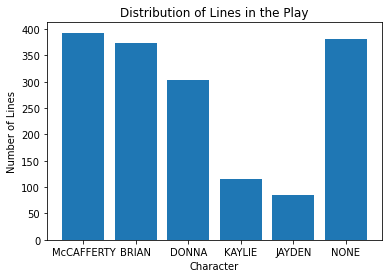

In [12]:
n_class_0 = features[features['character']=='McCAFFERTY.'].shape[0]
n_class_1 = features[features['character']=='BRIAN.'].shape[0]
n_class_2 = features[features['character']=='DONNA.'].shape[0]
n_class_3 = features[features['character']=='KAYLIE.'].shape[0]
n_class_4 = features[features['character']=='JAYDEN.'].shape[0]
n_class_5 = features[features['character']=='NONE.'].shape[0]
x = ['McCAFFERTY', 'BRIAN', 'DONNA', 'KAYLIE', 'JAYDEN', 'NONE' ]
y = np.array([n_class_0, n_class_1, n_class_2,n_class_3, n_class_4, n_class_5])
plt.bar(x, y)
plt.xlabel('Character')
plt.ylabel('Number of Lines')
plt.title('Distribution of Lines in the Play')

## Standardization (whole dataset) and data augmentation (training set)

In [13]:
# standardization

data = features.values[:,:-1]
scalar=StandardScaler()
data = scalar.fit_transform(data)
data = DataFrame(data)
data['character'] = features['character']
data

0         1         2         3         4         5         6  \
0     0.895194 -1.128218 -1.063590 -1.783293  0.768272 -0.633394 -0.793216   
1     0.895194 -1.128218 -1.063590 -1.783293  0.768272 -0.633394 -0.793216   
2     2.856056 -1.128218 -0.848251 -1.783293  0.768272 -0.633394 -0.793216   
3     0.895194 -0.698835 -0.417573 -1.111001 -2.122448 -0.633394 -0.793216   
4    -0.412047 -0.698835 -0.776471 -0.102563 -0.677088  1.578797  1.260691   
...        ...       ...       ...       ...       ...       ...       ...   
1647 -0.030768 -0.269452 -0.178307 -0.102563 -0.436195 -0.633394  1.260691   
1648  1.548815 -0.555707  0.013106 -0.662806  0.768272 -0.633394 -0.793216   
1649  0.148199  0.589314  0.946242 -0.342667  0.768272 -0.633394  1.260691   
1650  1.875625 -0.841963 -0.417573 -1.783293  0.768272 -0.633394 -0.793216   
1651  0.615071 -0.412580 -0.094564 -0.342667 -0.264128 -0.633394  1.260691   

             7         8         9        10        11        12        13  \
0    -0.774097 -1.019562 -0.458537 -0.895280  1.807964 -0.976073 -0.221108   
1    -0.774097 -1.019562 -0.458537 -0.895280  1.807964 -0.976073 -0.221108   
2    -0.774097 -1.019562 -0.458537 -0.895280  1.807964 -0.976073 -0.221108   
3    -0.774097 -1.019562 -0.458537 -0.895280 -0.553108  1.024513 -0.221108   
4     1.291828  0.980814 -0.458537 -0.895280  1.807964 -0.976073 -0.221108   
...        ...       ...       ...       ...       ...       ...       ...   
1647 -0.774097 -1.019562 -0.458537  1.116969 -0.553108  1.024513 -0.221108   
1648  1.291828 -1.019562 -0.458537 -0.895280 -0.553108 -0.976073 -0.221108   
1649 -0.774097 -1.019562 -0.458537  1.116969 -0.553108  1.024513 -0.221108   
1650 -0.774097 -1.019562 -0.458537 -0.895280 -0.553108  1.024513 -0.221108   
1651 -0.774097 -1.019562 -0.458537  1.116969 -0.553108  1.024513 -0.221108   

            14        15        16        17       18        19        20  \
0    -0.687292 -1.308680 -0.636209  0.034816 -0.34641 -0.024611 -0.049266   
1    -0.687292 -1.308680 -0.636209  0.034816 -0.34641 -0.024611 -0.049266   
2    -0.687292 -1.308680 -0.636209  0.034816 -0.34641 -0.024611 -0.049266   
3     1.454985 -1.308680  1.571810  0.034816 -0.34641 -0.024611 -0.049266   
4    -0.687292  0.764129 -0.636209  0.034816 -0.34641 -0.024611 -0.049266   
...        ...       ...       ...       ...      ...       ...       ...   
1647  1.454985  0.764129 -0.636209  0.034816 -0.34641 -0.024611 -0.049266   
1648 -0.687292 -1.308680  1.571810  0.034816 -0.34641 -0.024611 -0.049266   
1649 -0.687292 -1.308680  1.571810  0.034816 -0.34641 -0.024611 -0.049266   
1650 -0.687292 -1.308680  1.571810  0.034816 -0.34641 -0.024611 -0.049266   
1651 -0.687292 -1.308680  1.571810  0.034816 -0.34641 -0.024611 -0.049266   

            21        22        23        24        25        26        27  \
0    -1.413572 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
1    -1.413572 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
2    -1.413572 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
3    -1.413572 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
4     0.707428 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
...        ...       ...       ...       ...       ...       ...       ...   
1647  0.707428 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
1648  0.707428 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
1649 -1.413572 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
1650 -1.413572 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
1651  0.707428 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   

            28        29        30        31        32        33        34  \
0    -0.049266 -0.371135 -0.060375 -0.121417 -0.095724 -0.024611 -0.417288   
1    -0.049266 -0.371135 -0.060375 -0.121417 -0.095724 -0.024611 -0.417288   
2    -0.049266 -0.371135 -0.060375 -0.12141

In [14]:
X_train,X_test,Y_train,Y_test = train_test_split(data.drop(['character'], axis=1),data['character'],test_size=0.30, shuffle=True, stratify = data['character'])
print(X_train.shape, X_test.shape, Y_train.shape, Y_test.shape)

(1156, 1577) (496, 1577) (1156,) (496,)


Text(0.5, 1.0, 'Distribution of Lines in the Training Set before reshaping')

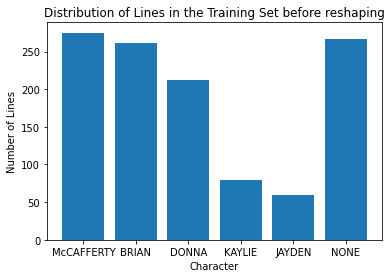

In [15]:
n_class_0 = Y_train[Y_train=='McCAFFERTY.'].shape[0]
n_class_1 = Y_train[Y_train=='BRIAN.'].shape[0]
n_class_2 = Y_train[Y_train=='DONNA.'].shape[0]
n_class_3 = Y_train[Y_train=='KAYLIE.'].shape[0]
n_class_4 = Y_train[Y_train=='JAYDEN.'].shape[0]
n_class_5 = Y_train[Y_train=='NONE.'].shape[0]
x = ['McCAFFERTY', 'BRIAN', 'DONNA', 'KAYLIE', 'JAYDEN', 'NONE' ]
y = np.array([n_class_0, n_class_1, n_class_2,n_class_3, n_class_4, n_class_5])
plt.bar(x, y)
plt.xlabel('Character')
plt.ylabel('Number of Lines')
plt.title('Distribution of Lines in the Training Set before reshaping')

In [16]:
# data augmentation throug SMOTE (Synthetic Minority Oversampling Technique)

oversample = SMOTE()
X_train_res, Y_train_res = oversample.fit_resample(X_train, Y_train)
print(X_train_res.shape, Y_train_res.shape, X_test.shape, Y_test.shape)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarni

(1650, 1577) (1650,) (496, 1577) (496,)


BRIAN. 275 16.67%
McCAFFERTY. 275 16.67%
KAYLIE. 275 16.67%
NONE. 275 16.67%
JAYDEN. 275 16.67%
DONNA. 275 16.67%


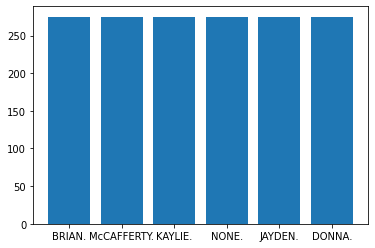

In [17]:
# new dialogue line distribution in train set

counter = Counter(Y_train_res)
for k,v in counter.items():
	per = v / len(Y_train_res) * 100
	print(k, v, "%.2f" % per+'%')
pyplot.bar(counter.keys(), counter.values())
pyplot.show()

## Classifiers (LogReg, Random Forest, knn, SVC, neural network)

In [55]:
dummy_clf = DummyClassifier(strategy='stratified')
dummy_clf.fit(X_train_res,Y_train_res)
clf_pred = dummy_clf.predict(X_test)
print(classification_report(Y_test, clf_pred))

              precision    recall  f1-score   support

      BRIAN.       0.21      0.14      0.17       112
      DONNA.       0.27      0.27      0.27        91
     JAYDEN.       0.04      0.16      0.07        25
     KAYLIE.       0.06      0.14      0.08        35
 McCAFFERTY.       0.24      0.17      0.20       118
       NONE.       0.26      0.15      0.19       115

    accuracy                           0.18       496
   macro avg       0.18      0.17      0.16       496
weighted avg       0.22      0.18      0.19       496



In [21]:
logmodel = LogisticRegression(multi_class='multinomial', solver='newton-cg', max_iter=100000)
logmodel.fit(X_train_res,Y_train_res)
predictions = logmodel.predict(X_test)
print(classification_report(Y_test,predictions))

              precision    recall  f1-score   support

      BRIAN.       0.40      0.40      0.40       112
      DONNA.       0.31      0.27      0.29        91
     JAYDEN.       0.09      0.20      0.12        25
     KAYLIE.       0.07      0.09      0.08        35
 McCAFFERTY.       0.34      0.26      0.30       118
       NONE.       0.81      0.81      0.81       115

    accuracy                           0.41       496
   macro avg       0.34      0.34      0.33       496
weighted avg       0.43      0.41      0.41       496



Text(0.5, 1.0, 'LogReg confusion matrix')

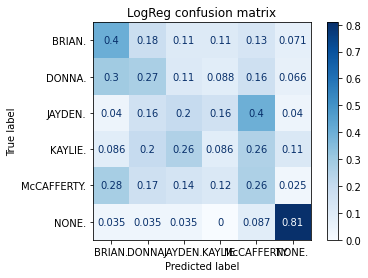

In [22]:
disp = metrics.plot_confusion_matrix(logmodel, X_test, Y_test, display_labels=None, cmap=plt.cm.Blues, normalize='true')
disp.ax_.set_title('LogReg confusion matrix')

In [23]:
knn = KNeighborsClassifier(n_neighbors=6)

knn.fit(X_train_res, Y_train_res)

pred = knn.predict(X_test)

print(classification_report(Y_test, pred))

              precision    recall  f1-score   support

      BRIAN.       0.33      0.27      0.30       112
      DONNA.       0.29      0.27      0.28        91
     JAYDEN.       0.02      0.12      0.04        25
     KAYLIE.       0.11      0.26      0.15        35
 McCAFFERTY.       0.28      0.07      0.11       118
       NONE.       0.83      0.62      0.71       115

    accuracy                           0.29       496
   macro avg       0.31      0.27      0.26       496
weighted avg       0.39      0.29      0.32       496



Text(0.5, 1.0, 'knn confusion matrix')

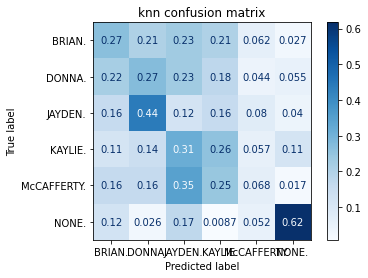

In [24]:
disp = metrics.plot_confusion_matrix(knn, X_test, Y_test, display_labels=None, cmap=plt.cm.Blues, normalize='true')
disp.ax_.set_title('knn confusion matrix')

In [25]:
clf = svm.SVC(kernel='linear') 
clf.fit(X_train_res, Y_train_res)
y_pred = clf.predict(X_test)
print(classification_report(Y_test, y_pred))

              precision    recall  f1-score   support

      BRIAN.       0.31      0.39      0.35       112
      DONNA.       0.24      0.25      0.25        91
     JAYDEN.       0.12      0.28      0.16        25
     KAYLIE.       0.00      0.00      0.00        35
 McCAFFERTY.       0.25      0.15      0.19       118
       NONE.       0.83      0.68      0.75       115

    accuracy                           0.34       496
   macro avg       0.29      0.29      0.28       496
weighted avg       0.37      0.34      0.35       496



Text(0.5, 1.0, 'LogReg confusion matrix')

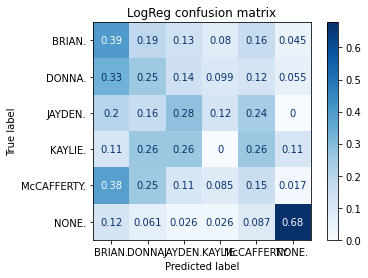

In [26]:
disp = metrics.plot_confusion_matrix(clf, X_test, Y_test, display_labels=None, cmap=plt.cm.Blues, normalize='true')
disp.ax_.set_title('LogReg confusion matrix')

In [27]:
RF_class = RandomForestClassifier(random_state=1)
RF_class.fit(X_train_res, Y_train_res)

y_pred_rf = RF_class.predict(X_test)
print(classification_report(Y_test, y_pred_rf))

              precision    recall  f1-score   support

      BRIAN.       0.26      0.25      0.26       112
      DONNA.       0.29      0.25      0.27        91
     JAYDEN.       0.07      0.04      0.05        25
     KAYLIE.       0.15      0.06      0.08        35
 McCAFFERTY.       0.37      0.50      0.42       118
       NONE.       0.84      0.90      0.87       115

    accuracy                           0.44       496
   macro avg       0.33      0.33      0.33       496
weighted avg       0.41      0.44      0.42       496



Text(0.5, 1.0, 'LogReg confusion matrix')

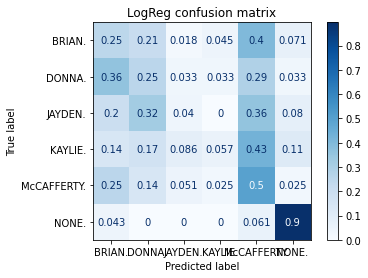

In [28]:
disp = metrics.plot_confusion_matrix(RF_class, X_test, Y_test, display_labels=None, cmap=plt.cm.Blues, normalize='true')
disp.ax_.set_title('LogReg confusion matrix')

In [29]:
featuresNN = data.copy(())
featuresNN

0         1         2         3         4         5         6  \
0     0.895194 -1.128218 -1.063590 -1.783293  0.768272 -0.633394 -0.793216   
1     0.895194 -1.128218 -1.063590 -1.783293  0.768272 -0.633394 -0.793216   
2     2.856056 -1.128218 -0.848251 -1.783293  0.768272 -0.633394 -0.793216   
3     0.895194 -0.698835 -0.417573 -1.111001 -2.122448 -0.633394 -0.793216   
4    -0.412047 -0.698835 -0.776471 -0.102563 -0.677088  1.578797  1.260691   
...        ...       ...       ...       ...       ...       ...       ...   
1647 -0.030768 -0.269452 -0.178307 -0.102563 -0.436195 -0.633394  1.260691   
1648  1.548815 -0.555707  0.013106 -0.662806  0.768272 -0.633394 -0.793216   
1649  0.148199  0.589314  0.946242 -0.342667  0.768272 -0.633394  1.260691   
1650  1.875625 -0.841963 -0.417573 -1.783293  0.768272 -0.633394 -0.793216   
1651  0.615071 -0.412580 -0.094564 -0.342667 -0.264128 -0.633394  1.260691   

             7         8         9        10        11        12        13  \
0    -0.774097 -1.019562 -0.458537 -0.895280  1.807964 -0.976073 -0.221108   
1    -0.774097 -1.019562 -0.458537 -0.895280  1.807964 -0.976073 -0.221108   
2    -0.774097 -1.019562 -0.458537 -0.895280  1.807964 -0.976073 -0.221108   
3    -0.774097 -1.019562 -0.458537 -0.895280 -0.553108  1.024513 -0.221108   
4     1.291828  0.980814 -0.458537 -0.895280  1.807964 -0.976073 -0.221108   
...        ...       ...       ...       ...       ...       ...       ...   
1647 -0.774097 -1.019562 -0.458537  1.116969 -0.553108  1.024513 -0.221108   
1648  1.291828 -1.019562 -0.458537 -0.895280 -0.553108 -0.976073 -0.221108   
1649 -0.774097 -1.019562 -0.458537  1.116969 -0.553108  1.024513 -0.221108   
1650 -0.774097 -1.019562 -0.458537 -0.895280 -0.553108  1.024513 -0.221108   
1651 -0.774097 -1.019562 -0.458537  1.116969 -0.553108  1.024513 -0.221108   

            14        15        16        17       18        19        20  \
0    -0.687292 -1.308680 -0.636209  0.034816 -0.34641 -0.024611 -0.049266   
1    -0.687292 -1.308680 -0.636209  0.034816 -0.34641 -0.024611 -0.049266   
2    -0.687292 -1.308680 -0.636209  0.034816 -0.34641 -0.024611 -0.049266   
3     1.454985 -1.308680  1.571810  0.034816 -0.34641 -0.024611 -0.049266   
4    -0.687292  0.764129 -0.636209  0.034816 -0.34641 -0.024611 -0.049266   
...        ...       ...       ...       ...      ...       ...       ...   
1647  1.454985  0.764129 -0.636209  0.034816 -0.34641 -0.024611 -0.049266   
1648 -0.687292 -1.308680  1.571810  0.034816 -0.34641 -0.024611 -0.049266   
1649 -0.687292 -1.308680  1.571810  0.034816 -0.34641 -0.024611 -0.049266   
1650 -0.687292 -1.308680  1.571810  0.034816 -0.34641 -0.024611 -0.049266   
1651 -0.687292 -1.308680  1.571810  0.034816 -0.34641 -0.024611 -0.049266   

            21        22        23        24        25        26        27  \
0    -1.413572 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
1    -1.413572 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
2    -1.413572 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
3    -1.413572 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
4     0.707428 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
...        ...       ...       ...       ...       ...       ...       ...   
1647  0.707428 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
1648  0.707428 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
1649 -1.413572 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
1650 -1.413572 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
1651  0.707428 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   

            28        29        30        31        32        33        34  \
0    -0.049266 -0.371135 -0.060375 -0.121417 -0.095724 -0.024611 -0.417288   
1    -0.049266 -0.371135 -0.060375 -0.121417 -0.095724 -0.024611 -0.417288   
2    -0.049266 -0.371135 -0.060375 -0.12141

In [30]:
X = featuresNN.iloc[:, :-1]
y = featuresNN.iloc[:,-1]

enc = OneHotEncoder()
Y = enc.fit_transform(y[:, np.newaxis]).toarray()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  """


In [31]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, stratify = Y, random_state=4)

n_features = X.shape[1]
n_classes = Y.shape[1]

print(n_features, n_classes)

1577 6


In [32]:
oversample = SMOTE()
X_train_res, Y_train_res = oversample.fit_resample(X_train, Y_train)
print(X_train_res.shape, Y_train_res.shape, X_test.shape, Y_test.shape)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarni

(1650, 1577) (1650, 6) (496, 1577) (496, 6)


In [33]:
from keras import backend as K

def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

In [34]:
def create_custom_model(input_dim, output_dim, nodes, n=1, name='model'):
    def create_model():
        # Create model
        model = Sequential(name=name)
        for i in range(n):
            model.add(Dense(nodes, input_dim=input_dim, activation='relu'))
        model.add(Dense(output_dim, activation='softmax'))

        # Compile model
        model.compile(loss='categorical_crossentropy', 
                      optimizer='adam', 
                      metrics=['accuracy', f1_m,precision_m, recall_m])
        return model
    return create_model

models = [create_custom_model(n_features, n_classes, 8, i, 'model_{}'.format(i)) 
          for i in range(1, 4)]

for create_model in models:
    create_model().summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 12624     
_________________________________________________________________
dense_1 (Dense)              (None, 6)                 54        
Total params: 12,678
Trainable params: 12,678
Non-trainable params: 0
_________________________________________________________________
Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2 (Dense)              (None, 8)                 12624     
_________________________________________________________________
dense_3 (Dense)              (None, 8)                 72        
_________________________________________________________________
dense_4 (Dense)              (None, 6)                 54        
Total params: 12,750
Trainable params:

In [35]:
history_dict = {}

# TensorBoard Callback
cb = TensorBoard()

for create_model in models:
    model = create_model()
    print('Model name:', model.name)
    history_callback = model.fit(X_train_res, Y_train_res,
                                 batch_size=5,
                                 epochs=10,
                                 verbose=0,
                                 validation_data=(X_test, Y_test),
                                 callbacks=[cb])
    loss, accuracy, f1_score, precision, recall = model.evaluate(X_test, Y_test, verbose=0)
    print(loss, accuracy, f1_score, precision, recall)
    
    history_dict[model.name] = [history_callback, model]


Model name: model_1
2.5508880615234375 0.4092741906642914 0.3909069299697876 0.4688534736633301 0.3359375
Model name: model_2
2.5412611961364746 0.35080644488334656 0.34875166416168213 0.4209146201610565 0.298828125
Model name: model_3
2.4122986793518066 0.35282257199287415 0.3510797917842865 0.43181729316711426 0.296875


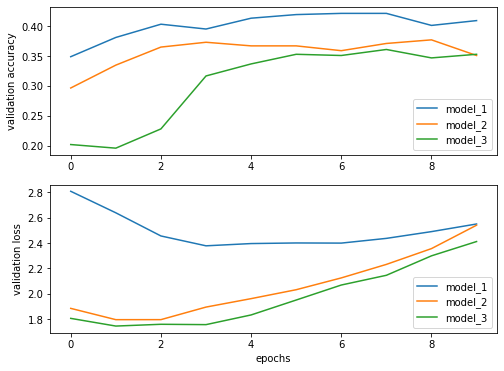

In [36]:
fig, (ax1, ax2) = plt.subplots(2, figsize=(8, 6))

for model_name in history_dict:
    val_accurady = history_dict[model_name][0].history['val_accuracy']
    val_loss = history_dict[model_name][0].history['val_loss']
    ax1.plot(val_accurady, label=model_name)
    ax2.plot(val_loss, label=model_name)
    
ax1.set_ylabel('validation accuracy')
ax2.set_ylabel('validation loss')
ax2.set_xlabel('epochs')
ax1.legend()
ax2.legend();



In [37]:
create_model = create_custom_model(n_features, n_classes, 8, 3)

estimator = KerasClassifier(build_fn=create_model, epochs=100, batch_size=5, verbose=0)
score = cross_val_score(estimator, X_train, Y_train, cv=10)
print("Accuracy : {:0.2f} (+/- {:0.2f})".format(score.mean(), score.std()))

Accuracy : 0.39 (+/- 0.05)


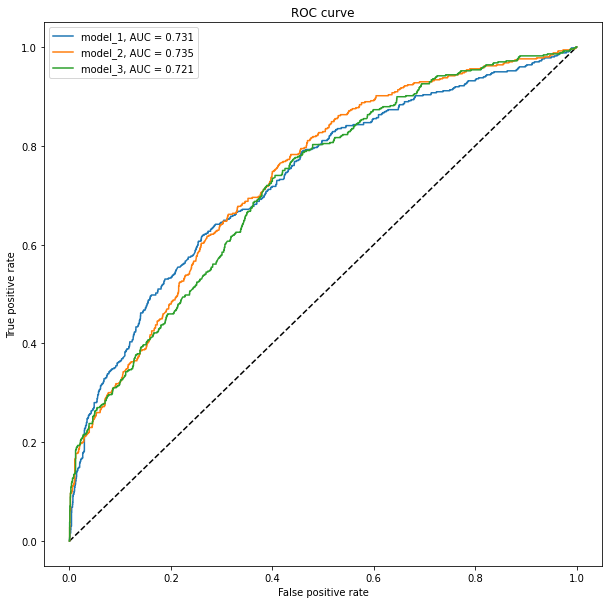

In [38]:
from sklearn.metrics import roc_curve, auc

plt.figure(figsize=(10, 10))
plt.plot([0, 1], [0, 1], 'k--')

for model_name in history_dict:
    model = history_dict[model_name][1]
    
    Y_pred = model.predict(X_test)
    fpr, tpr, threshold = roc_curve(Y_test.ravel(), Y_pred.ravel())
    
    plt.plot(fpr, tpr, label='{}, AUC = {:.3f}'.format(model_name, auc(fpr, tpr)))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend();

## 2d projections with PCA and t-SNE

In [39]:
df_graf = featuresNN
y = df_graf.iloc[:,-1]

In [40]:
np.random.seed(42)
rndperm = np.random.permutation(df_graf.shape[0])

In [41]:
pca = PCA(n_components=3)
pca_result = pca.fit_transform(df_graf.iloc[:,:-1].values)
df_graf['pca-one'] = pca_result[:,0]
df_graf['pca-two'] = pca_result[:,1] 
df_graf['pca-three'] = pca_result[:,2]
print('Explained variation per principal component: {}'.format(pca.explained_variance_ratio_))

Explained variation per principal component: [0.02332483 0.01240692 0.01060922]


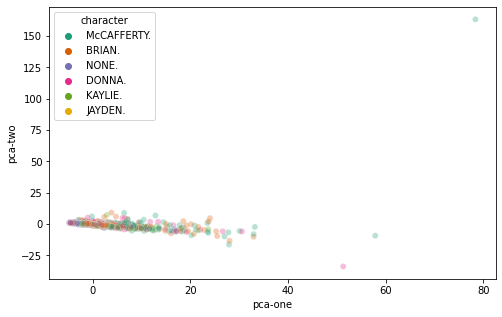

In [42]:
plt.figure(figsize=(8,5))
sns.scatterplot(
    x="pca-one", 
    y="pca-two",
    hue = 'character',
    palette=sns.color_palette('Dark2',6),
    data=df_graf.loc[rndperm,:],
    legend="full",
    alpha=0.3
)

In [53]:
df_tsne = features.copy()
df_tsne["character_num"] = [1 if ele  == "McCAFFERTY." else 2 if ele == 'BRIAN.' else 3 if ele == 'DONNA.' else 4 if ele == 'KAYLIE.' else 5 if ele == "JAYDEN." else 6 for ele in df_tsne["character"]]
df_tsne = df_tsne.drop(['character'], axis=1)
df_tsne_f = df_tsne.iloc[:,:-2]
df_tsne_t = df_tsne.iloc[:,-1]

KeyError: ignored

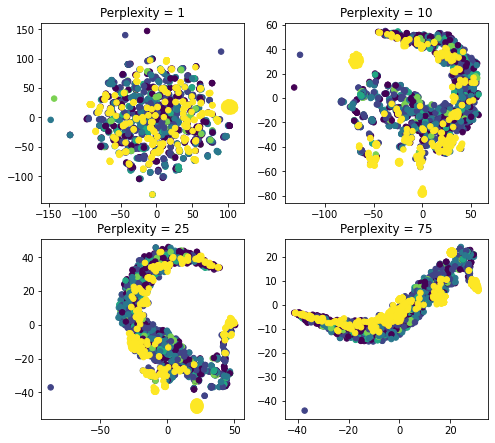

In [44]:
plt.figure(figsize = (8,4))
plt.subplots_adjust(top = 1.5)

for index, p in enumerate([1, 10, 25, 75]):

    tsne = TSNE(n_components = 2, perplexity = p, random_state=10)
    tsne_results = tsne.fit_transform(df_tsne_f)
    
    tsne_results=pd.DataFrame(tsne_results, columns=['tsne1', 'tsne2'])
    
    plt.subplot(2,2,index+1)
    plt.scatter(tsne_results['tsne1'], tsne_results['tsne2'], c=df_tsne_t, s=30)
    plt.title('Perplexity = '+ str(p))
plt.show()

## Visual representation of different features

In [45]:
df_grafici = features.copy()
df_grafici.head()

,avg_word_length,avg_sent_length,avg_sent_length_char,prop_stopwords,typetoken_ratio,ADJ,ADP,ADV,AUX,CCONJ,DET,INTJ,NOUN,NUM,PART,PRON,PROPN,PUNCT,SCONJ,SPACE,SYM,VERB,X,"(ADJ, ADJ)","(ADJ, ADP)","(ADJ, ADV)","(ADJ, AUX)","(ADJ, CCONJ)","(ADJ, DET)","(ADJ, NOUN)","(ADJ, NUM)","(ADJ, PART)","(ADJ, PRON)","(ADJ, PROPN)","(ADJ, PUNCT)","(ADJ, SCONJ)","(ADJ, SYM)","(ADJ, VERB)","(ADP, ADJ)","(ADP, ADP)","(ADP, ADV)","(ADP, AUX)","(ADP, CCONJ)","(ADP, DET)","(ADP, NOUN)","(ADP, NUM)","(ADP, PART)","(ADP, PRON)","(ADP, PROPN)","(ADP, PUNCT)","(ADP, SCONJ)","(ADP, VERB)","(ADV, ADJ)","(ADV, ADP)","(ADV, ADV)","(ADV, AUX)","(ADV, CCONJ)","(ADV, DET)","(ADV, NOUN)","(ADV, NUM)","(ADV, PART)","(ADV, PRON)","(ADV, PROPN)","(ADV, PUNCT)","(ADV, SCONJ)","(ADV, SYM)","(ADV, VERB)","(AUX, ADJ)","(AUX, ADP)","(AUX, ADV)","(AUX, AUX)","(AUX, CCONJ)","(AUX, DET)","(AUX, INTJ)","(AUX, NOUN)","(AUX, NUM)","(AUX, PART)","(AUX, PRON)","(AUX, PROPN)","(AUX, PUNCT)","(AUX, SCONJ)","(AUX, VERB)","(CCONJ, ADJ)","(CCONJ, ADP)","(CCONJ, ADV)","(CCONJ, AUX)","(CCONJ, DET)","(CCONJ, INTJ)","(CCONJ, NOUN)","(CCONJ, PART)","(CCONJ, PRON)","(CCONJ, PROPN)","(CCONJ, PUNCT)","(CCONJ, SCONJ)","(CCONJ, VERB)","(DET, ADJ)","(DET, ADP)","(DET, ADV)","(DET, AUX)","(DET, CCONJ)","(DET, DET)","(DET, INTJ)","(DET, NOUN)","(DET, NUM)","(DET, PRON)","(DET, PROPN)","(DET, PUNCT)","(DET, SCONJ)","(DET, VERB)","(INTJ, ADJ)","(INTJ, ADV)","(INTJ, AUX)","(INTJ, CCONJ)","(INTJ, DET)","(INTJ, INTJ)","(INTJ, NOUN)","(INTJ, PRON)","(INTJ, PROPN)","(INTJ, PUNCT)","(INTJ, SCONJ)","(INTJ, VERB)","(NOUN, ADJ)","(NOUN, ADP)","(NOUN, ADV)","(NOUN, AUX)","(NOUN, CCONJ)","(NOUN, DET)","(NOUN, INTJ)","(NOUN, NOUN)","(NOUN, PART)","(NOUN, PRON)","(NOUN, PROPN)","(NOUN, PUNCT)","(NOUN, SCONJ)","(NOUN, SYM)","(NOUN, VERB)","(NUM, ADJ)","(NUM, ADP)","(NUM, ADV)","(NUM, CCONJ)","(NUM, DET)","(NUM, NOUN)","(NUM, PART)","(NUM, PUNCT)","(NUM, VERB)","(PART, ADJ)","(PART, ADP)","(PART, ADV)","(PART, AUX)","(PART, DET)","(PART, NOUN)","(PART, NUM)","(PART, PART)","(PART, PRON)","(PART, PROPN)","(PART, PUNCT)","(PART, SCONJ)","(PART, SPACE)","(PART, VERB)","(PRON, ADJ)","(PRON, ADP)","(PRON, ADV)","(PRON, AUX)","(PRON, CCONJ)","(PRON, DET)","(PRON, INTJ)","(PRON, NOUN)","(PRON, NUM)","(PRON, PART)","(PRON, PRON)","(PRON, PROPN)","(PRON, PUNCT)","(PRON, SCONJ)","(PRON, VERB)","(PROPN, ADJ)","(PROPN, ADP)","(PROPN, ADV)","(PROPN, AUX)","(PROPN, CCONJ)","(PROPN, DET)","(PROPN, NOUN)","(PROPN, PART)","(PROPN, PRON)","(PROPN, PROPN)","(PROPN, PUNCT)","(PROPN, SCONJ)","(PROPN, SYM)","(PROPN, VERB)","(PUNCT, ADJ)","(PUNCT, ADP)","(PUNCT, ADV)","(PUNCT, AUX)","(PUNCT, CCONJ)","(PUNCT, DET)","(PUNCT, INTJ)","(PUNCT, NOUN)","(PUNCT, NUM)","(PUNCT, PART)","(PUNCT, PRON)","(PUNCT, PROPN)","(PUNCT, PUNCT)","(PUNCT, SCONJ)","(PUNCT, VERB)","(PUNCT, X)","(SCONJ, ADJ)","(SCONJ, ADP)","(SCONJ, ADV)","(SCONJ, DET)","(SCONJ, NOUN)","(SCONJ, NUM)","(SCONJ, PART)","(SCONJ, PRON)","(SCONJ, PROPN)","(SCONJ, PUNCT)","(SCONJ, SCONJ)","(SPACE, VERB)","(SYM, NOUN)","(SYM, PROPN)","(VERB, ADJ)","(VERB, ADP)","(VERB, ADV)","(VERB, AUX)","(VERB, CCONJ)","(VERB, DET)","(VERB, INTJ)","(VERB, NOUN)","(VERB, NUM)","(VERB, PART)","(VERB, PRON)","(VERB, PROPN)","(VERB, PUNCT)","(VERB, SCONJ)","(VERB, VERB)","(X, PUNCT)","(ADJ, ADJ, NOUN)","(ADJ, ADJ, PUNCT)","(ADJ, ADP, ADJ)","(ADJ, ADP, ADP)","(ADJ, ADP, ADV)","(ADJ, ADP, DET)","(ADJ, ADP, NOUN)","(ADJ, ADP, NUM)","(ADJ, ADP, PRON)","(ADJ, ADP, PROPN)","(ADJ, ADP, PUNCT)","(ADJ, ADP, VERB)","(ADJ, ADV, ADJ)","(ADJ, ADV, PRON)","(ADJ, ADV, PUNCT)","(ADJ, AUX, PART)","(ADJ, AUX, PRON)","(ADJ, CCONJ, ADJ)","(ADJ, CCONJ, DET)","(ADJ, CCONJ, PRON)","(ADJ, CCONJ, VERB)","(ADJ, DET, AUX)","(ADJ, DET, DET)","(ADJ, DET, NOUN)","(ADJ, NOUN, ADJ)","(ADJ, NOUN, ADP)","(ADJ, NOUN, ADV)","(ADJ, NOUN, AUX)","(ADJ, NOUN, CCONJ)","(ADJ, NOUN, DET)","(ADJ, NOUN, NOUN)","(ADJ, NOUN, PART)","(ADJ, NOUN, PRON)","(ADJ, NOUN, PUNCT)","(ADJ, NOUN, SCONJ)","(ADJ, NOUN, VERB)","(ADJ, NUM, ADP)","(ADJ, NUM, NO

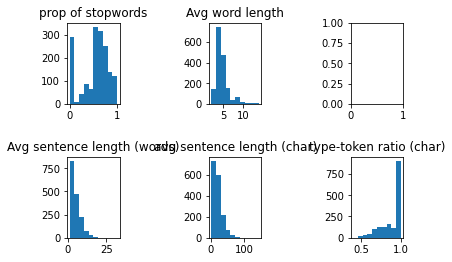

In [46]:
#this describes the text in general, not single characters

n_bins = 10
fig, axs = plt.subplots(2, 3)
axs[0,0].hist(df_grafici['prop_stopwords'], bins = n_bins)
axs[0,0].set_title('prop of stopwords')
axs[0,1].hist(df_grafici['avg_word_length'], bins = n_bins)
axs[0,1].set_title('Avg word length')
axs[1,0].hist(df_grafici['avg_sent_length'], bins = n_bins)
axs[1,0].set_title('Avg sentence length (words)')
axs[1,1].hist(df_grafici['avg_sent_length_char'], bins = n_bins)
axs[1,1].set_title('avg sentence length (char)')
axs[1,2].hist(df_grafici['typetoken_ratio'], bins = n_bins)
axs[1,2].set_title('type-token ratio (char)')
fig.tight_layout(pad=2.0)

<Figure size 576x360 with 0 Axes>

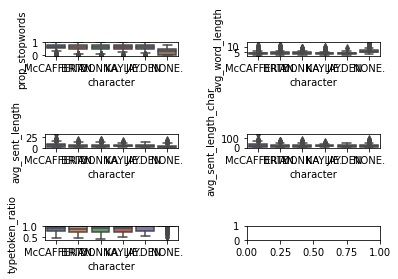

In [47]:
plt.figure(figsize=(8,5))
fig, axs = plt.subplots(3,2)
sns.set(rc={'figure.figsize':(11.7,8.27)})
fn = ['prop_stopwords', 'avg_word_length', 'avg_sent_length', 'avg_sent_length_char', 'typetoken_ratio']
cn = ['McCAFFERTY.', 'BRIAN.', 'DONNA.', 'KAYLIE.', 'JAYDEN.', 'NONE.']
sns.boxplot(x = 'character', y = 'prop_stopwords', data = df_grafici, order = cn, ax = axs[0,0]);
sns.boxplot(x = 'character', y = 'avg_word_length', data = df_grafici, order = cn, ax = axs[0,1]);
sns.boxplot(x = 'character', y = 'avg_sent_length', data = df_grafici, order = cn, ax = axs[1,0]);
sns.boxplot(x = 'character', y = 'avg_sent_length_char', data = df_grafici,  order = cn, ax = axs[1,1]);
sns.boxplot(x = 'character', y = 'typetoken_ratio', data = df_grafici,  order = cn, ax = axs[2,0]);
fig.tight_layout(pad=2.0);

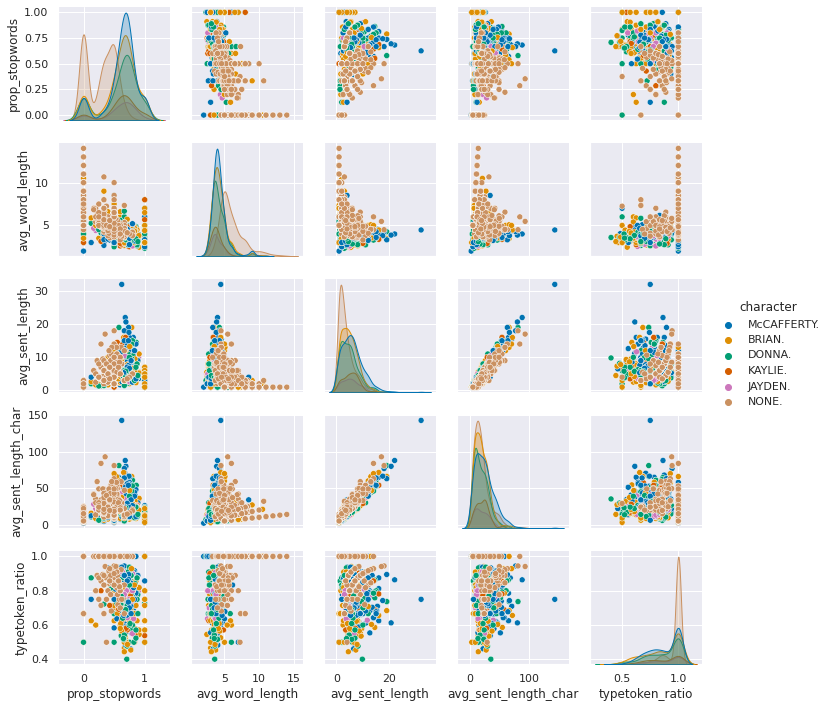

In [48]:
sns.pairplot(df_grafici[['prop_stopwords', 'avg_word_length', 'avg_sent_length', 'avg_sent_length_char', 'typetoken_ratio', 'character']], hue='character', height = 2, palette = 'colorblind')

# !! NEXT SESSION IS EXACTLY THE SAME BUT FOR MALE / FEMALE / NONE

# M/F/N

## Preprocessing

In [11]:
spacy_stopwords = spacy.lang.en.stop_words.STOP_WORDS
nlp = en_core_web_sm.load()

In [12]:
corpus = pd.read_csv('corpus-coli-project-wnone.tsv', sep='\t')
print(corpus)

        character                                               text
0     McCAFFERTY.                                             Hello?
1          BRIAN.                                             Hello.
2     McCAFFERTY.                                          Hello...?
3          BRIAN.                  CHARCHAR CHARCHAR. CHARCHAR's da?
4     McCAFFERTY.   Oh. Great. Come in, come in. You're very prompt.
...           ...                                                ...
1647        NONE.  CHARCHAR nods. He sees the psychologist's lett...
1648        NONE.                            CHARCHAR almost laughs.
1649        NONE.           CHARCHAR snaps the letter from his hand.
1650        NONE.                                   CHARCHAR leaves.
1651        NONE.      CHARCHAR looks around the classroom. The End.

[1652 rows x 2 columns]


In [13]:
def getfeatures(corpus):
  
  tokens_nopunct = []
  lower = []
  lemma = []
  pos = []
  lemma_nopunct = []
  stopwords = []
  stopwords_words = []
  len_words = []
  sent_count = []
  dependency = []
  bigrams_ww = []
  trigrams_ww = []
  bigrams_pos = []
  trigrams_pos = []
  typetoken_ratio = []
  a = []
  
  for doc in nlp.pipe(corpus['text'].astype('unicode').values):
      if doc.is_parsed:
          tokens_nopunct.append([n.text for n in doc if n.is_punct != True])
          lower.append([n.lower_ for n in doc])
          lemma.append([n.lemma_ for n in doc])
          pos.append([n.pos_ for n in doc])
          lemma_nopunct.append([n.lemma_ for n in doc if n.is_punct != True])
          stopwords.append([n.is_stop == True for n in doc if n.is_punct != True])
          len_words.append([len(n) for n in doc])
          sent_count.append(len(list(doc.sents)))
          dependency.append([n.dep_ for n in doc])
      else:
          tokens_nopunct.append(None)
          lower.append(None)
          lemma.append(None)
          pos.append(None)
          lemma_nopunct.append(None)
          stopwords.append(None)
          len_words.append(None)
          sent_count.append(None)
          dependency.append(None)
          
  corpus['text_tokens_nopunct'] = tokens_nopunct
  corpus['text_lower'] = lower
  corpus['text_lemma'] = lemma
  corpus['text_pos'] = pos
  corpus['lemma_nopunct'] = lemma_nopunct
  corpus['stopwords'] = stopwords
  corpus['pos_count'] = corpus.text_pos.apply(lambda x: len(str(x).split(',')))
  corpus['stop_count'] = [sum(i) for i in corpus['stopwords']]
  corpus['len_words'] = len_words
  corpus['total_len_words'] = [sum(i) for i in corpus['len_words']]
  corpus['word_count'] = [len(i) for i in corpus['text_tokens_nopunct']]
  corpus['sent_count'] = sent_count
  corpus['prop_stopwords'] = corpus['stop_count'] / corpus['word_count']
  corpus['avg_word_length'] = corpus['total_len_words'] / corpus['word_count']
  corpus['avg_sent_length'] = corpus['word_count'] / corpus['sent_count']
  corpus['avg_sent_length_char'] = corpus['total_len_words'] / corpus['sent_count']
  corpus['dependency'] = dependency
  
  for doc in nlp.pipe(corpus['text_lower'].astype('unicode').values):
      if doc.is_parsed:
          stopwords_words.append([n for n in doc if n.is_stop == True])
      else:
          stopwords_words.append(None)
  corpus['stopwords_words'] = stopwords_words
      
  for line in corpus['text_pos']:
    bigrams_pos.append(list(nltk.bigrams(line)))
  corpus['bigrams_pos'] = bigrams_pos

  for line in corpus['text_pos']:
    if len(line) > 2:
      trigrams_pos.append(list(nltk.trigrams(line)))
    if len(line) <= 2:
      trigrams_pos.append(a)
  corpus['trigrams_pos'] = trigrams_pos
  
  for line in corpus['lemma_nopunct']:
      linetext = " ".join(str(x) for x in line)
      lexrich_line = LexicalRichness(linetext)
      typetoken_ratio.append(lexrich_line.ttr)

  corpus['typetoken_ratio'] = typetoken_ratio

In [14]:
getfeatures(corpus)
pd.set_option('display.max_columns', None)

In [15]:
important_features = corpus[['character', 'avg_word_length', 'avg_sent_length', 'avg_sent_length_char', 'prop_stopwords', 'typetoken_ratio', 'text_pos', 'bigrams_pos', 'trigrams_pos']].copy()
important_features.head()

,character,avg_word_length,avg_sent_length,avg_sent_length_char,prop_stopwords,typetoken_ratio,text_pos,bigrams_pos,trigrams_pos
0,McCAFFERTY.,6.0,1.0,6.0,0.0,1.0,"[INTJ, PUNCT]","[(INTJ, PUNCT)]",[]
1,BRIAN.,6.0,1.0,6.0,0.0,1.0,"[INTJ, PUNCT]","[(INTJ, PUNCT)]",[]
2,McCAFFERTY.,9.0,1.0,9.0,0.0,1.0,"[INTJ, PUNCT, PUNCT]","[(INTJ, PUNCT), (PUNCT, PUNCT)]","[(INTJ, PUNCT, PUNCT)]"
3,BRIAN.,6.0,2.5,15.0,0.2,0.6,"[PROPN, PROPN, PUNCT, PROPN, PART, NOUN, PUNCT]","[(PROPN, PROPN), (PROPN, PUNCT), (PUNCT, PROPN...","[(PROPN, PROPN, PUNCT), (PROPN, PUNCT, PROPN),..."
4,McCAFFERTY.,4.0,2.5,10.0,0.5,0.8,"[INTJ, PUNCT, ADJ, PUNCT, VERB, ADP, PUNCT, VE...","[(INTJ, PUNCT), (PUNCT, ADJ), (ADJ, PUNCT), (P...","[(INTJ, PUNCT, ADJ), (PUNCT, ADJ, PUNCT), (ADJ..."


In [16]:
mlb = MultiLabelBinarizer()
important_features = important_features.join(pd.DataFrame(mlb.fit_transform(important_features.pop('text_pos')),
                          columns=mlb.classes_,
                          index=important_features.index))

important_features = important_features.join(pd.DataFrame(mlb.fit_transform(important_features.pop('bigrams_pos')),
                          columns=mlb.classes_,
                          index=important_features.index))

important_features = important_features.join(pd.DataFrame(mlb.fit_transform(important_features.pop('trigrams_pos')),
                          columns=mlb.classes_,
                          index=important_features.index))

In [17]:
features = important_features.drop(['character'],axis=1)
features['character'] = important_features['character']
features["character_mf"] = ['MALE' if ele  == "McCAFFERTY." else 'MALE' if ele == 'BRIAN.' else 'FEMALE' if ele == 'DONNA.' else 'FEMALE' if ele == 'KAYLIE.' else 'MALE' if ele == "JAYDEN." else 'NONE' for ele in features["character"]]
features = features.drop(['character'], axis = 1)
features

avg_word_length  avg_sent_length  avg_sent_length_char  prop_stopwords  \
0            6.000000              1.0              6.000000        0.000000   
1            6.000000              1.0              6.000000        0.000000   
2            9.000000              1.0              9.000000        0.000000   
3            6.000000              2.5             15.000000        0.200000   
4            4.000000              2.5             10.000000        0.500000   
...               ...              ...                   ...             ...   
1647         4.583333              4.0             18.333333        0.500000   
1648         7.000000              3.0             21.000000        0.333333   
1649         4.857143              7.0             34.000000        0.428571   
1650         7.500000              2.0             15.000000        0.000000   
1651         5.571429              3.5             19.500000        0.428571   

      typetoken_ratio  ADJ  ADP  ADV  AUX  CCONJ  DET  INTJ  NOUN  NUM  PART  \
0            1.000000    0    0    0    0      0    0     1     0    0     0   
1            1.000000    0    0    0    0      0    0     1     0    0     0   
2            1.000000    0    0    0    0      0    0     1     0    0     0   
3            0.600000    0    0    0    0      0    0     0     1    0     1   
4            0.800000    1    1    1    1      0    0     1     0    0     0   
...               ...  ...  ...  ...  ...    ...  ...   ...   ...  ...   ...   
1647         0.833333    0    1    0    0      0    1     0     1    0     1   
1648         1.000000    0    0    1    0      0    0     0     0    0     0   
1649         1.000000    0    1    0    0      0    1     0     1    0     0   
1650         1.000000    0    0    0    0      0    0     0     1    0     0   
1651         0.857143    0    1    0    0      0    1     0     1    0     0   

      PRON  PROPN  PUNCT  SCONJ  SPACE  SYM  VERB  X  (ADJ, ADJ)  (ADJ, ADP)  \
0        0      0      1      0      0    0     0  0           0           0   
1        0      0      1      0      0    0     0  0           0           0   
2        0      0      1      0      0    0     0  0           0           0   
3        0      1      1      0      0    0     0  0           0           0   
4        1      0      1      0      0    0     1  0           0           0   
...    ...    ...    ...    ...    ...  ...   ... ..         ...         ...   
1647     1      0      1      0      0    0     1  0           0           0   
1648     0      1      1      0      0    0     1  0           0           0   
1649     0      1      1      0      0    0     0  0           0           0   
1650     0      1      1      0      0    0     0  0           0           0   
1651     0      1      1      0      0    0     1  0           0           0   

      (ADJ, ADV)  (ADJ, AUX)  (ADJ, CCONJ)  (ADJ, DET)  (ADJ, NOUN)  \
0              0           0             0           0            0   
1              0           0             0           0            0   
2              0           0             0           0            0   
3              0           0             0           0            0   
4              0           0             0           0            0   
...          ...         ...           ...         ...          ...   
1647           0           0             0           0            0   
1648           0           0             0           0            0   
1649           0           0             0           0            0   
1650           0           0             0           0            0   
1651           0           0             0           0            0   

      (ADJ, NUM)  (ADJ, PART)  (ADJ, PRON)  (ADJ, PROPN)  (ADJ, PUNCT)  \
0              0            0            0             0             0   
1              0            0            0             0             0   
2              0            0            0      

Text(0.5, 1.0, 'Distribution of Lines in the Play')

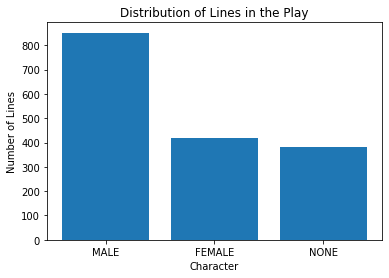

In [18]:
n_class_0 = features[features['character_mf']=='MALE'].shape[0]
n_class_1 = features[features['character_mf']=='FEMALE'].shape[0]
n_class_2 = features[features['character_mf']=='NONE'].shape[0]
x = ['MALE', 'FEMALE', 'NONE' ]
y = np.array([n_class_0, n_class_1, n_class_2])
plt.bar(x, y)
plt.xlabel('Character')
plt.ylabel('Number of Lines')
plt.title('Distribution of Lines in the Play')

## Standardization (whole dataset) and data augmentation (training set)

In [19]:
data = features.values[:,:-1]
scalar=StandardScaler()
data = scalar.fit_transform(data)
data = DataFrame(data)
data['character'] = features['character_mf']
data

0         1         2         3         4         5         6  \
0     0.895194 -1.128218 -1.063590 -1.783293  0.768272 -0.633394 -0.793216   
1     0.895194 -1.128218 -1.063590 -1.783293  0.768272 -0.633394 -0.793216   
2     2.856056 -1.128218 -0.848251 -1.783293  0.768272 -0.633394 -0.793216   
3     0.895194 -0.698835 -0.417573 -1.111001 -2.122448 -0.633394 -0.793216   
4    -0.412047 -0.698835 -0.776471 -0.102563 -0.677088  1.578797  1.260691   
...        ...       ...       ...       ...       ...       ...       ...   
1647 -0.030768 -0.269452 -0.178307 -0.102563 -0.436195 -0.633394  1.260691   
1648  1.548815 -0.555707  0.013106 -0.662806  0.768272 -0.633394 -0.793216   
1649  0.148199  0.589314  0.946242 -0.342667  0.768272 -0.633394  1.260691   
1650  1.875625 -0.841963 -0.417573 -1.783293  0.768272 -0.633394 -0.793216   
1651  0.615071 -0.412580 -0.094564 -0.342667 -0.264128 -0.633394  1.260691   

             7         8         9        10        11        12        13  \
0    -0.774097 -1.019562 -0.458537 -0.895280  1.807964 -0.976073 -0.221108   
1    -0.774097 -1.019562 -0.458537 -0.895280  1.807964 -0.976073 -0.221108   
2    -0.774097 -1.019562 -0.458537 -0.895280  1.807964 -0.976073 -0.221108   
3    -0.774097 -1.019562 -0.458537 -0.895280 -0.553108  1.024513 -0.221108   
4     1.291828  0.980814 -0.458537 -0.895280  1.807964 -0.976073 -0.221108   
...        ...       ...       ...       ...       ...       ...       ...   
1647 -0.774097 -1.019562 -0.458537  1.116969 -0.553108  1.024513 -0.221108   
1648  1.291828 -1.019562 -0.458537 -0.895280 -0.553108 -0.976073 -0.221108   
1649 -0.774097 -1.019562 -0.458537  1.116969 -0.553108  1.024513 -0.221108   
1650 -0.774097 -1.019562 -0.458537 -0.895280 -0.553108  1.024513 -0.221108   
1651 -0.774097 -1.019562 -0.458537  1.116969 -0.553108  1.024513 -0.221108   

            14        15        16        17       18        19        20  \
0    -0.687292 -1.308680 -0.636209  0.034816 -0.34641 -0.024611 -0.049266   
1    -0.687292 -1.308680 -0.636209  0.034816 -0.34641 -0.024611 -0.049266   
2    -0.687292 -1.308680 -0.636209  0.034816 -0.34641 -0.024611 -0.049266   
3     1.454985 -1.308680  1.571810  0.034816 -0.34641 -0.024611 -0.049266   
4    -0.687292  0.764129 -0.636209  0.034816 -0.34641 -0.024611 -0.049266   
...        ...       ...       ...       ...      ...       ...       ...   
1647  1.454985  0.764129 -0.636209  0.034816 -0.34641 -0.024611 -0.049266   
1648 -0.687292 -1.308680  1.571810  0.034816 -0.34641 -0.024611 -0.049266   
1649 -0.687292 -1.308680  1.571810  0.034816 -0.34641 -0.024611 -0.049266   
1650 -0.687292 -1.308680  1.571810  0.034816 -0.34641 -0.024611 -0.049266   
1651 -0.687292 -1.308680  1.571810  0.034816 -0.34641 -0.024611 -0.049266   

            21        22        23        24        25        26        27  \
0    -1.413572 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
1    -1.413572 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
2    -1.413572 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
3    -1.413572 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
4     0.707428 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
...        ...       ...       ...       ...       ...       ...       ...   
1647  0.707428 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
1648  0.707428 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
1649 -1.413572 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
1650 -1.413572 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
1651  0.707428 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   

            28        29        30        31        32        33        34  \
0    -0.049266 -0.371135 -0.060375 -0.121417 -0.095724 -0.024611 -0.417288   
1    -0.049266 -0.371135 -0.060375 -0.121417 -0.095724 -0.024611 -0.417288   
2    -0.049266 -0.371135 -0.060375 -0.12141

In [20]:
X_train,X_test,Y_train,Y_test = train_test_split(data.drop(['character'], axis=1),data['character'],test_size=0.30, shuffle=True, stratify = data['character'])
print(X_train.shape, X_test.shape, Y_train.shape, Y_test.shape)

(1156, 1577) (496, 1577) (1156,) (496,)


FEMALE 293 25.35%
MALE 596 51.56%
NONE 267 23.10%


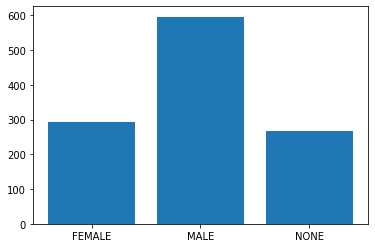

In [21]:
counter = Counter(Y_train) # da applicare solo su y train lo smote
for k,v in counter.items():
	per = v / len(Y_train) * 100
	print(k, v, "%.2f" % per+'%')
# plot the distribution
pyplot.bar(counter.keys(), counter.values())
pyplot.show()

In [22]:
oversample = SMOTE()
X_train_res, Y_train_res = oversample.fit_resample(X_train, Y_train)
print(X_train_res.shape, Y_train_res.shape, X_test.shape, Y_test.shape)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


(1788, 1577) (1788,) (496, 1577) (496,)


FEMALE 596 33.33%
MALE 596 33.33%
NONE 596 33.33%


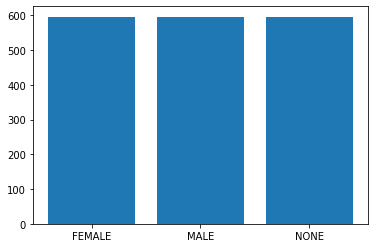

In [23]:
counter = Counter(Y_train_res)
for k,v in counter.items():
	per = v / len(Y_train_res) * 100
	print(k, v, "%.2f" % per+'%')
# plot the distribution
pyplot.bar(counter.keys(), counter.values())
pyplot.show()

## Classifiers (LogReg, Random Forest, knn, SVC, neural network)

In [24]:
dummy_clf = DummyClassifier(strategy='stratified')
dummy_clf.fit(X_train_res,Y_train_res)
clf_pred = dummy_clf.predict(X_test)
print(classification_report(Y_test, clf_pred))

              precision    recall  f1-score   support

      FEMALE       0.25      0.36      0.29       125
        MALE       0.53      0.32      0.40       256
        NONE       0.22      0.31      0.26       115

    accuracy                           0.33       496
   macro avg       0.33      0.33      0.32       496
weighted avg       0.39      0.33      0.34       496



In [25]:
logmodel = LogisticRegression(multi_class='multinomial', solver='newton-cg', max_iter=100000)
logmodel.fit(X_train_res,Y_train_res)
predictions = logmodel.predict(X_test)
print(classification_report(Y_test,predictions))

              precision    recall  f1-score   support

      FEMALE       0.38      0.45      0.41       125
        MALE       0.69      0.62      0.65       256
        NONE       0.83      0.87      0.85       115

    accuracy                           0.63       496
   macro avg       0.63      0.64      0.64       496
weighted avg       0.65      0.63      0.64       496



Text(0.5, 1.0, 'LogReg confusion matrix')

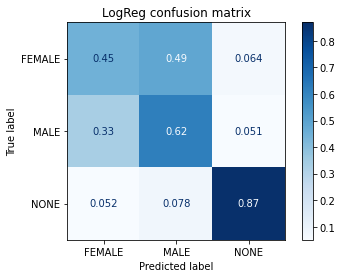

In [26]:
disp = metrics.plot_confusion_matrix(logmodel, X_test, Y_test, display_labels=None, cmap=plt.cm.Blues, normalize='true')
disp.ax_.set_title('LogReg confusion matrix')

In [27]:
knn = KNeighborsClassifier(n_neighbors=6)

knn.fit(X_train_res, Y_train_res)

pred = knn.predict(X_test)

print(classification_report(Y_test, pred))

              precision    recall  f1-score   support

      FEMALE       0.31      0.60      0.41       125
        MALE       0.67      0.25      0.36       256
        NONE       0.60      0.84      0.70       115

    accuracy                           0.48       496
   macro avg       0.53      0.56      0.49       496
weighted avg       0.56      0.48      0.45       496



In [28]:
clf = svm.SVC(kernel='linear') 
clf.fit(X_train_res, Y_train_res)
y_pred = clf.predict(X_test)
print(classification_report(Y_test, y_pred))

              precision    recall  f1-score   support

      FEMALE       0.37      0.51      0.43       125
        MALE       0.70      0.56      0.62       256
        NONE       0.82      0.84      0.83       115

    accuracy                           0.61       496
   macro avg       0.63      0.64      0.63       496
weighted avg       0.64      0.61      0.62       496



In [29]:
RF_class = RandomForestClassifier(random_state=1)
RF_class.fit(X_train_res, Y_train_res)

y_pred_rf = RF_class.predict(X_test)
print(classification_report(Y_test, y_pred_rf))


              precision    recall  f1-score   support

      FEMALE       0.43      0.26      0.33       125
        MALE       0.67      0.80      0.73       256
        NONE       0.88      0.85      0.86       115

    accuracy                           0.68       496
   macro avg       0.66      0.64      0.64       496
weighted avg       0.66      0.68      0.66       496



In [30]:
featuresNN = data.copy(())
featuresNN

0         1         2         3         4         5         6  \
0     0.895194 -1.128218 -1.063590 -1.783293  0.768272 -0.633394 -0.793216   
1     0.895194 -1.128218 -1.063590 -1.783293  0.768272 -0.633394 -0.793216   
2     2.856056 -1.128218 -0.848251 -1.783293  0.768272 -0.633394 -0.793216   
3     0.895194 -0.698835 -0.417573 -1.111001 -2.122448 -0.633394 -0.793216   
4    -0.412047 -0.698835 -0.776471 -0.102563 -0.677088  1.578797  1.260691   
...        ...       ...       ...       ...       ...       ...       ...   
1647 -0.030768 -0.269452 -0.178307 -0.102563 -0.436195 -0.633394  1.260691   
1648  1.548815 -0.555707  0.013106 -0.662806  0.768272 -0.633394 -0.793216   
1649  0.148199  0.589314  0.946242 -0.342667  0.768272 -0.633394  1.260691   
1650  1.875625 -0.841963 -0.417573 -1.783293  0.768272 -0.633394 -0.793216   
1651  0.615071 -0.412580 -0.094564 -0.342667 -0.264128 -0.633394  1.260691   

             7         8         9        10        11        12        13  \
0    -0.774097 -1.019562 -0.458537 -0.895280  1.807964 -0.976073 -0.221108   
1    -0.774097 -1.019562 -0.458537 -0.895280  1.807964 -0.976073 -0.221108   
2    -0.774097 -1.019562 -0.458537 -0.895280  1.807964 -0.976073 -0.221108   
3    -0.774097 -1.019562 -0.458537 -0.895280 -0.553108  1.024513 -0.221108   
4     1.291828  0.980814 -0.458537 -0.895280  1.807964 -0.976073 -0.221108   
...        ...       ...       ...       ...       ...       ...       ...   
1647 -0.774097 -1.019562 -0.458537  1.116969 -0.553108  1.024513 -0.221108   
1648  1.291828 -1.019562 -0.458537 -0.895280 -0.553108 -0.976073 -0.221108   
1649 -0.774097 -1.019562 -0.458537  1.116969 -0.553108  1.024513 -0.221108   
1650 -0.774097 -1.019562 -0.458537 -0.895280 -0.553108  1.024513 -0.221108   
1651 -0.774097 -1.019562 -0.458537  1.116969 -0.553108  1.024513 -0.221108   

            14        15        16        17       18        19        20  \
0    -0.687292 -1.308680 -0.636209  0.034816 -0.34641 -0.024611 -0.049266   
1    -0.687292 -1.308680 -0.636209  0.034816 -0.34641 -0.024611 -0.049266   
2    -0.687292 -1.308680 -0.636209  0.034816 -0.34641 -0.024611 -0.049266   
3     1.454985 -1.308680  1.571810  0.034816 -0.34641 -0.024611 -0.049266   
4    -0.687292  0.764129 -0.636209  0.034816 -0.34641 -0.024611 -0.049266   
...        ...       ...       ...       ...      ...       ...       ...   
1647  1.454985  0.764129 -0.636209  0.034816 -0.34641 -0.024611 -0.049266   
1648 -0.687292 -1.308680  1.571810  0.034816 -0.34641 -0.024611 -0.049266   
1649 -0.687292 -1.308680  1.571810  0.034816 -0.34641 -0.024611 -0.049266   
1650 -0.687292 -1.308680  1.571810  0.034816 -0.34641 -0.024611 -0.049266   
1651 -0.687292 -1.308680  1.571810  0.034816 -0.34641 -0.024611 -0.049266   

            21        22        23        24        25        26        27  \
0    -1.413572 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
1    -1.413572 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
2    -1.413572 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
3    -1.413572 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
4     0.707428 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
...        ...       ...       ...       ...       ...       ...       ...   
1647  0.707428 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
1648  0.707428 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
1649 -1.413572 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
1650 -1.413572 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
1651  0.707428 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   

            28        29        30        31        32        33        34  \
0    -0.049266 -0.371135 -0.060375 -0.121417 -0.095724 -0.024611 -0.417288   
1    -0.049266 -0.371135 -0.060375 -0.121417 -0.095724 -0.024611 -0.417288   
2    -0.049266 -0.371135 -0.060375 -0.12141

In [31]:
X = featuresNN.iloc[:, :-1]
y = featuresNN.iloc[:,-1]

enc = OneHotEncoder()
Y = enc.fit_transform(y[:, np.newaxis]).toarray()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  """


In [32]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, stratify = Y, random_state=4)

n_features = X.shape[1]
n_classes = Y.shape[1]

print(n_features, n_classes)

1577 3


In [33]:
oversample = SMOTE()
X_train_res, Y_train_res = oversample.fit_resample(X_train, Y_train)
print(X_train_res.shape, Y_train_res.shape, X_test.shape, Y_test.shape)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


(1788, 1577) (1788, 3) (496, 1577) (496, 3)


In [36]:
from keras import backend as K

def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

In [38]:
def create_custom_model(input_dim, output_dim, nodes, n=1, name='model'):
    def create_model():
        # Create model
        model = Sequential(name=name)
        for i in range(n):
            model.add(Dense(nodes, input_dim=input_dim, activation='relu'))
        model.add(Dense(output_dim, activation='softmax'))

        # Compile model
        model.compile(loss='categorical_crossentropy', 
                      optimizer='adam', 
                      metrics=['accuracy', f1_m,precision_m, recall_m])
        return model
    return create_model

models = [create_custom_model(n_features, n_classes, 8, i, 'model_{}'.format(i)) 
          for i in range(1, 4)]

for create_model in models:
    create_model().summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_13 (Dense)             (None, 8)                 12624     
_________________________________________________________________
dense_14 (Dense)             (None, 3)                 27        
Total params: 12,651
Trainable params: 12,651
Non-trainable params: 0
_________________________________________________________________
Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_15 (Dense)             (None, 8)                 12624     
_________________________________________________________________
dense_16 (Dense)             (None, 8)                 72        
_________________________________________________________________
dense_17 (Dense)             (None, 3)                 27        
Total params: 12,723
Trainable params:

In [39]:
history_dict = {}

# TensorBoard Callback
cb = TensorBoard()

for create_model in models:
    model = create_model()
    print('Model name:', model.name)
    history_callback = model.fit(X_train_res, Y_train_res,
                                 batch_size=5,
                                 epochs=10,
                                 verbose=0,
                                 validation_data=(X_test, Y_test),
                                 callbacks=[cb])
    loss, accuracy, f1_score, precision, recall = model.evaluate(X_test, Y_test, verbose=0)
    print(loss, accuracy, f1_score, precision, recall)
    
    history_dict[model.name] = [history_callback, model]


Model name: model_1
1.5769352912902832 0.6028226017951965 0.6054893136024475 0.6141437292098999 0.59765625
Model name: model_2
1.2547951936721802 0.5604838728904724 0.556199312210083 0.5683953762054443 0.544921875
Model name: model_3
1.32001793384552 0.6108871102333069 0.6129602193832397 0.6167044639587402 0.609375


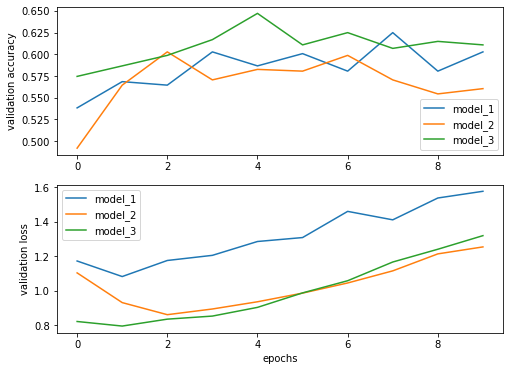

In [40]:
fig, (ax1, ax2) = plt.subplots(2, figsize=(8, 6))

for model_name in history_dict:
    val_accurady = history_dict[model_name][0].history['val_accuracy']
    val_loss = history_dict[model_name][0].history['val_loss']
    ax1.plot(val_accurady, label=model_name)
    ax2.plot(val_loss, label=model_name)
    
ax1.set_ylabel('validation accuracy')
ax2.set_ylabel('validation loss')
ax2.set_xlabel('epochs')
ax1.legend()
ax2.legend();


In [41]:
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import cross_val_score

create_model = create_custom_model(n_features, n_classes, 8, 3)

estimator = KerasClassifier(build_fn=create_model, epochs=100, batch_size=5, verbose=0)
scores = cross_val_score(estimator, X_train_res, Y_train_res, cv=10)
print("Accuracy : {:0.2f} (+/- {:0.2f})".format(scores.mean(), scores.std()))


Accuracy : 0.79 (+/- 0.12)


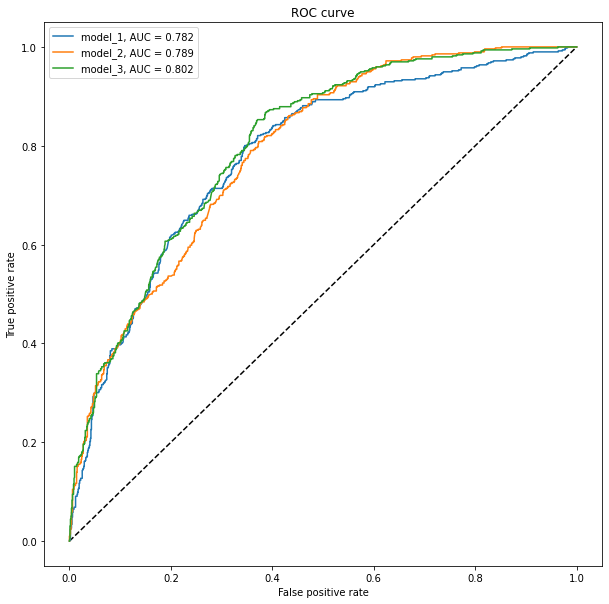

In [42]:
from sklearn.metrics import roc_curve, auc

plt.figure(figsize=(10, 10))
plt.plot([0, 1], [0, 1], 'k--')

for model_name in history_dict:
    model = history_dict[model_name][1]
    
    Y_pred = model.predict(X_test)
    fpr, tpr, threshold = roc_curve(Y_test.ravel(), Y_pred.ravel())
    
    plt.plot(fpr, tpr, label='{}, AUC = {:.3f}'.format(model_name, auc(fpr, tpr)))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend();

## 2d projections with PCA and t-SNE

In [43]:
df_graf = featuresNN
y = df_graf.iloc[:,-1]

In [44]:
np.random.seed(42)
rndperm = np.random.permutation(df_graf.shape[0])

In [45]:
pca = PCA(n_components=3)
pca_result = pca.fit_transform(df_graf.iloc[:,:-1].values)
df_graf['pca-one'] = pca_result[:,0]
df_graf['pca-two'] = pca_result[:,1] 
df_graf['pca-three'] = pca_result[:,2]
print('Explained variation per principal component: {}'.format(pca.explained_variance_ratio_))

Explained variation per principal component: [0.02332483 0.01240692 0.01060922]


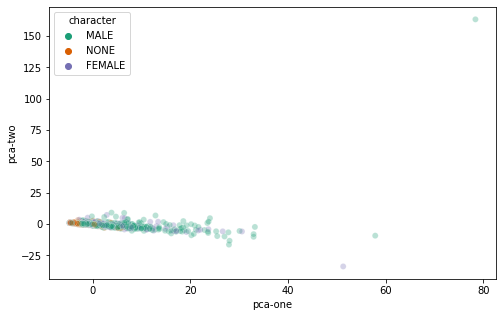

In [46]:
plt.figure(figsize=(8,5))
sns.scatterplot(
    x="pca-one", 
    y="pca-two",
    hue = 'character',
    palette=sns.color_palette('Dark2',3),
    data=df_graf.loc[rndperm,:],
    legend="full",
    alpha=0.3
)

In [56]:
df_tsne = features.copy()
df_tsne["character_num"] = [1 if ele  == "MALE" else 2 if ele == 'FEMALE' else 3 for ele in df_tsne["character_mf"]]
df_tsne = df_tsne.drop(['character_mf'], axis=1)
df_tsne_f = df_tsne.iloc[:,:-2]
df_tsne_t = df_tsne.iloc[:,-1]

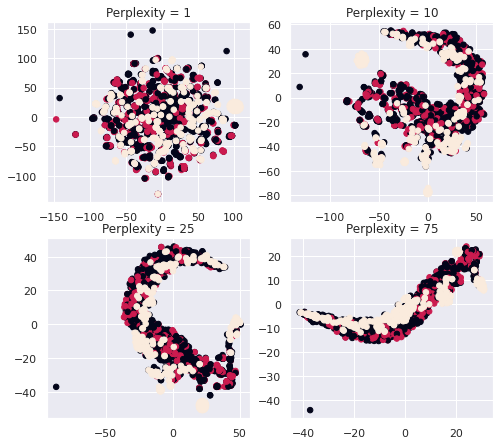

In [57]:
plt.figure(figsize = (8,4))
plt.subplots_adjust(top = 1.5)

for index, p in enumerate([1, 10, 25, 75]):

    tsne = TSNE(n_components = 2, perplexity = p, random_state=10)
    tsne_results = tsne.fit_transform(df_tsne_f)
    
    tsne_results=pd.DataFrame(tsne_results, columns=['tsne1', 'tsne2'])
    
    plt.subplot(2,2,index+1)
    plt.scatter(tsne_results['tsne1'], tsne_results['tsne2'], c=df_tsne_t, s=30)
    plt.title('Perplexity = '+ str(p))
plt.show()

## Visual representation of different features

In [58]:
df_grafici = features.copy()
df_grafici.head()

,avg_word_length,avg_sent_length,avg_sent_length_char,prop_stopwords,typetoken_ratio,ADJ,ADP,ADV,AUX,CCONJ,DET,INTJ,NOUN,NUM,PART,PRON,PROPN,PUNCT,SCONJ,SPACE,SYM,VERB,X,"(ADJ, ADJ)","(ADJ, ADP)","(ADJ, ADV)","(ADJ, AUX)","(ADJ, CCONJ)","(ADJ, DET)","(ADJ, NOUN)","(ADJ, NUM)","(ADJ, PART)","(ADJ, PRON)","(ADJ, PROPN)","(ADJ, PUNCT)","(ADJ, SCONJ)","(ADJ, SYM)","(ADJ, VERB)","(ADP, ADJ)","(ADP, ADP)","(ADP, ADV)","(ADP, AUX)","(ADP, CCONJ)","(ADP, DET)","(ADP, NOUN)","(ADP, NUM)","(ADP, PART)","(ADP, PRON)","(ADP, PROPN)","(ADP, PUNCT)","(ADP, SCONJ)","(ADP, VERB)","(ADV, ADJ)","(ADV, ADP)","(ADV, ADV)","(ADV, AUX)","(ADV, CCONJ)","(ADV, DET)","(ADV, NOUN)","(ADV, NUM)","(ADV, PART)","(ADV, PRON)","(ADV, PROPN)","(ADV, PUNCT)","(ADV, SCONJ)","(ADV, SYM)","(ADV, VERB)","(AUX, ADJ)","(AUX, ADP)","(AUX, ADV)","(AUX, AUX)","(AUX, CCONJ)","(AUX, DET)","(AUX, INTJ)","(AUX, NOUN)","(AUX, NUM)","(AUX, PART)","(AUX, PRON)","(AUX, PROPN)","(AUX, PUNCT)","(AUX, SCONJ)","(AUX, VERB)","(CCONJ, ADJ)","(CCONJ, ADP)","(CCONJ, ADV)","(CCONJ, AUX)","(CCONJ, DET)","(CCONJ, INTJ)","(CCONJ, NOUN)","(CCONJ, PART)","(CCONJ, PRON)","(CCONJ, PROPN)","(CCONJ, PUNCT)","(CCONJ, SCONJ)","(CCONJ, VERB)","(DET, ADJ)","(DET, ADP)","(DET, ADV)","(DET, AUX)","(DET, CCONJ)","(DET, DET)","(DET, INTJ)","(DET, NOUN)","(DET, NUM)","(DET, PRON)","(DET, PROPN)","(DET, PUNCT)","(DET, SCONJ)","(DET, VERB)","(INTJ, ADJ)","(INTJ, ADV)","(INTJ, AUX)","(INTJ, CCONJ)","(INTJ, DET)","(INTJ, INTJ)","(INTJ, NOUN)","(INTJ, PRON)","(INTJ, PROPN)","(INTJ, PUNCT)","(INTJ, SCONJ)","(INTJ, VERB)","(NOUN, ADJ)","(NOUN, ADP)","(NOUN, ADV)","(NOUN, AUX)","(NOUN, CCONJ)","(NOUN, DET)","(NOUN, INTJ)","(NOUN, NOUN)","(NOUN, PART)","(NOUN, PRON)","(NOUN, PROPN)","(NOUN, PUNCT)","(NOUN, SCONJ)","(NOUN, SYM)","(NOUN, VERB)","(NUM, ADJ)","(NUM, ADP)","(NUM, ADV)","(NUM, CCONJ)","(NUM, DET)","(NUM, NOUN)","(NUM, PART)","(NUM, PUNCT)","(NUM, VERB)","(PART, ADJ)","(PART, ADP)","(PART, ADV)","(PART, AUX)","(PART, DET)","(PART, NOUN)","(PART, NUM)","(PART, PART)","(PART, PRON)","(PART, PROPN)","(PART, PUNCT)","(PART, SCONJ)","(PART, SPACE)","(PART, VERB)","(PRON, ADJ)","(PRON, ADP)","(PRON, ADV)","(PRON, AUX)","(PRON, CCONJ)","(PRON, DET)","(PRON, INTJ)","(PRON, NOUN)","(PRON, NUM)","(PRON, PART)","(PRON, PRON)","(PRON, PROPN)","(PRON, PUNCT)","(PRON, SCONJ)","(PRON, VERB)","(PROPN, ADJ)","(PROPN, ADP)","(PROPN, ADV)","(PROPN, AUX)","(PROPN, CCONJ)","(PROPN, DET)","(PROPN, NOUN)","(PROPN, PART)","(PROPN, PRON)","(PROPN, PROPN)","(PROPN, PUNCT)","(PROPN, SCONJ)","(PROPN, SYM)","(PROPN, VERB)","(PUNCT, ADJ)","(PUNCT, ADP)","(PUNCT, ADV)","(PUNCT, AUX)","(PUNCT, CCONJ)","(PUNCT, DET)","(PUNCT, INTJ)","(PUNCT, NOUN)","(PUNCT, NUM)","(PUNCT, PART)","(PUNCT, PRON)","(PUNCT, PROPN)","(PUNCT, PUNCT)","(PUNCT, SCONJ)","(PUNCT, VERB)","(PUNCT, X)","(SCONJ, ADJ)","(SCONJ, ADP)","(SCONJ, ADV)","(SCONJ, DET)","(SCONJ, NOUN)","(SCONJ, NUM)","(SCONJ, PART)","(SCONJ, PRON)","(SCONJ, PROPN)","(SCONJ, PUNCT)","(SCONJ, SCONJ)","(SPACE, VERB)","(SYM, NOUN)","(SYM, PROPN)","(VERB, ADJ)","(VERB, ADP)","(VERB, ADV)","(VERB, AUX)","(VERB, CCONJ)","(VERB, DET)","(VERB, INTJ)","(VERB, NOUN)","(VERB, NUM)","(VERB, PART)","(VERB, PRON)","(VERB, PROPN)","(VERB, PUNCT)","(VERB, SCONJ)","(VERB, VERB)","(X, PUNCT)","(ADJ, ADJ, NOUN)","(ADJ, ADJ, PUNCT)","(ADJ, ADP, ADJ)","(ADJ, ADP, ADP)","(ADJ, ADP, ADV)","(ADJ, ADP, DET)","(ADJ, ADP, NOUN)","(ADJ, ADP, NUM)","(ADJ, ADP, PRON)","(ADJ, ADP, PROPN)","(ADJ, ADP, PUNCT)","(ADJ, ADP, VERB)","(ADJ, ADV, ADJ)","(ADJ, ADV, PRON)","(ADJ, ADV, PUNCT)","(ADJ, AUX, PART)","(ADJ, AUX, PRON)","(ADJ, CCONJ, ADJ)","(ADJ, CCONJ, DET)","(ADJ, CCONJ, PRON)","(ADJ, CCONJ, VERB)","(ADJ, DET, AUX)","(ADJ, DET, DET)","(ADJ, DET, NOUN)","(ADJ, NOUN, ADJ)","(ADJ, NOUN, ADP)","(ADJ, NOUN, ADV)","(ADJ, NOUN, AUX)","(ADJ, NOUN, CCONJ)","(ADJ, NOUN, DET)","(ADJ, NOUN, NOUN)","(ADJ, NOUN, PART)","(ADJ, NOUN, PRON)","(ADJ, NOUN, PUNCT)","(ADJ, NOUN, SCONJ)","(ADJ, NOUN, VERB)","(ADJ, NUM, ADP)","(ADJ, NUM, NO

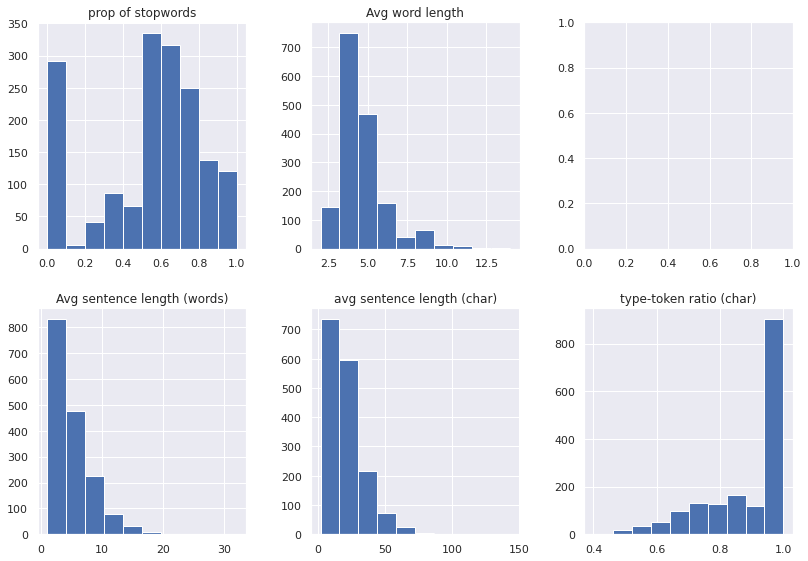

In [59]:
#this describes the text in general, not single characters
sns.set(rc={'figure.figsize':(11.7,8.27)})
n_bins = 10
fig, axs = plt.subplots(2, 3)
axs[0,0].hist(df_grafici['prop_stopwords'], bins = n_bins)
axs[0,0].set_title('prop of stopwords')
axs[0,1].hist(df_grafici['avg_word_length'], bins = n_bins)
axs[0,1].set_title('Avg word length')
axs[1,0].hist(df_grafici['avg_sent_length'], bins = n_bins)
axs[1,0].set_title('Avg sentence length (words)')
axs[1,1].hist(df_grafici['avg_sent_length_char'], bins = n_bins)
axs[1,1].set_title('avg sentence length (char)')
axs[1,2].hist(df_grafici['typetoken_ratio'], bins = n_bins)
axs[1,2].set_title('type-token ratio (char)')
fig.tight_layout(pad=2.0)

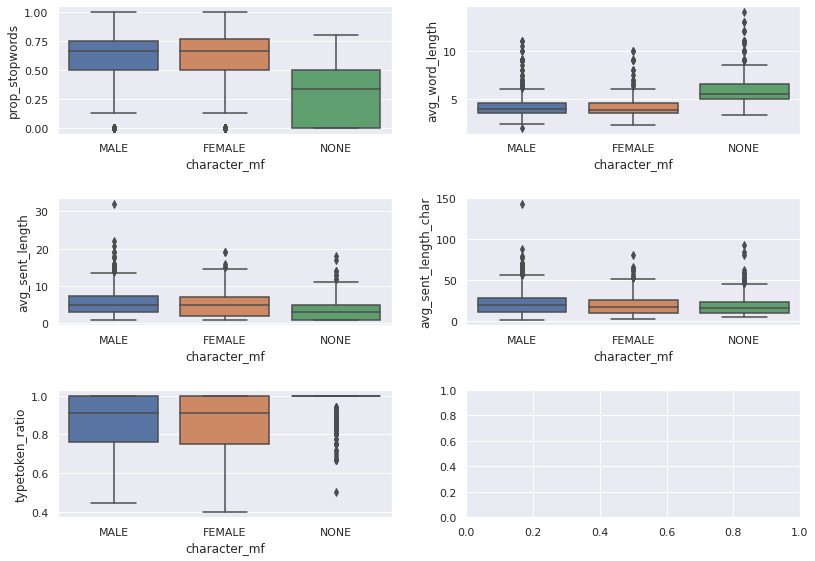

In [60]:
fig, axs = plt.subplots(3,2)
fn = ['prop_stopwords', 'avg_word_length', 'avg_sent_length', 'avg_sent_length_char', 'typetoken_ratio']
cn = ['MALE', 'FEMALE', 'NONE']
sns.boxplot(x = 'character_mf', y = 'prop_stopwords', data = df_grafici, order = cn, ax = axs[0,0]);
sns.boxplot(x = 'character_mf', y = 'avg_word_length', data = df_grafici, order = cn, ax = axs[0,1]);
sns.boxplot(x = 'character_mf', y = 'avg_sent_length', data = df_grafici, order = cn, ax = axs[1,0]);
sns.boxplot(x = 'character_mf', y = 'avg_sent_length_char', data = df_grafici,  order = cn, ax = axs[1,1]);
sns.boxplot(x = 'character_mf', y = 'typetoken_ratio', data = df_grafici,  order = cn, ax = axs[2,0]);
fig.tight_layout(pad=2.0);

In [61]:
df_grafici = df_grafici.loc[df_grafici.character_mf.isin(['MALE', 'FEMALE'])]

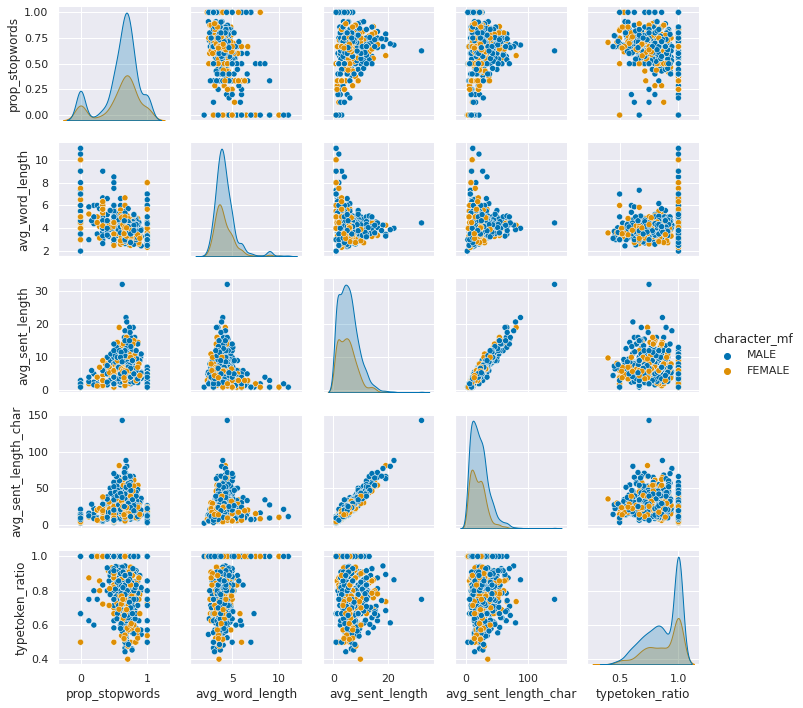

In [62]:
sns.pairplot(df_grafici[['prop_stopwords', 'avg_word_length', 'avg_sent_length', 'avg_sent_length_char', 'typetoken_ratio', 'character_mf']], hue='character_mf', height = 2, palette = 'colorblind')

# !! END, NEXT IS THE SAME BUT WITH ADULTS / CHILDREN / NONE

# Adults / children

## Preprocessing

In [63]:
corpus = pd.read_csv('corpus-coli-project-wnone.tsv', sep='\t')
print(corpus)

        character                                               text
0     McCAFFERTY.                                             Hello?
1          BRIAN.                                             Hello.
2     McCAFFERTY.                                          Hello...?
3          BRIAN.                  CHARCHAR CHARCHAR. CHARCHAR's da?
4     McCAFFERTY.   Oh. Great. Come in, come in. You're very prompt.
...           ...                                                ...
1647        NONE.  CHARCHAR nods. He sees the psychologist's lett...
1648        NONE.                            CHARCHAR almost laughs.
1649        NONE.           CHARCHAR snaps the letter from his hand.
1650        NONE.                                   CHARCHAR leaves.
1651        NONE.      CHARCHAR looks around the classroom. The End.

[1652 rows x 2 columns]


In [64]:
def getfeatures(corpus):
  
  tokens_nopunct = []
  lower = []
  lemma = []
  pos = []
  lemma_nopunct = []
  stopwords = []
  stopwords_words = []
  len_words = []
  sent_count = []
  dependency = []
  bigrams_ww = []
  trigrams_ww = []
  bigrams_pos = []
  trigrams_pos = []
  typetoken_ratio = []
  a = []
  
  for doc in nlp.pipe(corpus['text'].astype('unicode').values):
      if doc.is_parsed:
          tokens_nopunct.append([n.text for n in doc if n.is_punct != True])
          lower.append([n.lower_ for n in doc])
          lemma.append([n.lemma_ for n in doc])
          pos.append([n.pos_ for n in doc])
          lemma_nopunct.append([n.lemma_ for n in doc if n.is_punct != True])
          stopwords.append([n.is_stop == True for n in doc if n.is_punct != True])
          len_words.append([len(n) for n in doc])
          sent_count.append(len(list(doc.sents)))
          dependency.append([n.dep_ for n in doc])
      else:
          tokens_nopunct.append(None)
          lower.append(None)
          lemma.append(None)
          pos.append(None)
          lemma_nopunct.append(None)
          stopwords.append(None)
          len_words.append(None)
          sent_count.append(None)
          dependency.append(None)
          
  corpus['text_tokens_nopunct'] = tokens_nopunct
  corpus['text_lower'] = lower
  corpus['text_lemma'] = lemma
  corpus['text_pos'] = pos
  corpus['lemma_nopunct'] = lemma_nopunct
  corpus['stopwords'] = stopwords
  corpus['pos_count'] = corpus.text_pos.apply(lambda x: len(str(x).split(',')))
  corpus['stop_count'] = [sum(i) for i in corpus['stopwords']]
  corpus['len_words'] = len_words
  corpus['total_len_words'] = [sum(i) for i in corpus['len_words']]
  corpus['word_count'] = [len(i) for i in corpus['text_tokens_nopunct']]
  corpus['sent_count'] = sent_count
  corpus['prop_stopwords'] = corpus['stop_count'] / corpus['word_count']
  corpus['avg_word_length'] = corpus['total_len_words'] / corpus['word_count']
  corpus['avg_sent_length'] = corpus['word_count'] / corpus['sent_count']
  corpus['avg_sent_length_char'] = corpus['total_len_words'] / corpus['sent_count']
  corpus['dependency'] = dependency
  
  for doc in nlp.pipe(corpus['text_lower'].astype('unicode').values):
      if doc.is_parsed:
          stopwords_words.append([n for n in doc if n.is_stop == True])
      else:
          stopwords_words.append(None)
  corpus['stopwords_words'] = stopwords_words
      
  for line in corpus['text_pos']:
    bigrams_pos.append(list(nltk.bigrams(line)))
  corpus['bigrams_pos'] = bigrams_pos

  for line in corpus['text_pos']:
    if len(line) > 2:
      trigrams_pos.append(list(nltk.trigrams(line)))
    if len(line) <= 2:
      trigrams_pos.append(a)
  corpus['trigrams_pos'] = trigrams_pos
  
  for line in corpus['lemma_nopunct']:
      linetext = " ".join(str(x) for x in line)
      lexrich_line = LexicalRichness(linetext)
      typetoken_ratio.append(lexrich_line.ttr)

  corpus['typetoken_ratio'] = typetoken_ratio

In [65]:
getfeatures(corpus)
pd.set_option('display.max_columns', None)

In [66]:
important_features = corpus[['character', 'avg_word_length', 'avg_sent_length', 'avg_sent_length_char', 'prop_stopwords', 'typetoken_ratio', 'text_pos', 'bigrams_pos', 'trigrams_pos']].copy()
important_features.head()

,character,avg_word_length,avg_sent_length,avg_sent_length_char,prop_stopwords,typetoken_ratio,text_pos,bigrams_pos,trigrams_pos
0,McCAFFERTY.,6.0,1.0,6.0,0.0,1.0,"[INTJ, PUNCT]","[(INTJ, PUNCT)]",[]
1,BRIAN.,6.0,1.0,6.0,0.0,1.0,"[INTJ, PUNCT]","[(INTJ, PUNCT)]",[]
2,McCAFFERTY.,9.0,1.0,9.0,0.0,1.0,"[INTJ, PUNCT, PUNCT]","[(INTJ, PUNCT), (PUNCT, PUNCT)]","[(INTJ, PUNCT, PUNCT)]"
3,BRIAN.,6.0,2.5,15.0,0.2,0.6,"[PROPN, PROPN, PUNCT, PROPN, PART, NOUN, PUNCT]","[(PROPN, PROPN), (PROPN, PUNCT), (PUNCT, PROPN...","[(PROPN, PROPN, PUNCT), (PROPN, PUNCT, PROPN),..."
4,McCAFFERTY.,4.0,2.5,10.0,0.5,0.8,"[INTJ, PUNCT, ADJ, PUNCT, VERB, ADP, PUNCT, VE...","[(INTJ, PUNCT), (PUNCT, ADJ), (ADJ, PUNCT), (P...","[(INTJ, PUNCT, ADJ), (PUNCT, ADJ, PUNCT), (ADJ..."


In [67]:
mlb = MultiLabelBinarizer()
important_features = important_features.join(pd.DataFrame(mlb.fit_transform(important_features.pop('text_pos')),
                          columns=mlb.classes_,
                          index=important_features.index))

important_features = important_features.join(pd.DataFrame(mlb.fit_transform(important_features.pop('bigrams_pos')),
                          columns=mlb.classes_,
                          index=important_features.index))

important_features = important_features.join(pd.DataFrame(mlb.fit_transform(important_features.pop('trigrams_pos')),
                          columns=mlb.classes_,
                          index=important_features.index))

In [68]:
features = important_features.drop(['character'],axis=1)
features['character'] = important_features['character']
features["character_ac"] = ['ADULT' if ele  == "McCAFFERTY." else 'ADULT' if ele == 'BRIAN.' else 'ADULT' if ele == 'DONNA.' else 'CHILD' if ele == 'KAYLIE.' else 'CHILD' if ele == "JAYDEN." else 'NONE' for ele in features["character"]]
features = features.drop(['character'], axis = 1)
features

avg_word_length  avg_sent_length  avg_sent_length_char  prop_stopwords  \
0            6.000000              1.0              6.000000        0.000000   
1            6.000000              1.0              6.000000        0.000000   
2            9.000000              1.0              9.000000        0.000000   
3            6.000000              2.5             15.000000        0.200000   
4            4.000000              2.5             10.000000        0.500000   
...               ...              ...                   ...             ...   
1647         4.583333              4.0             18.333333        0.500000   
1648         7.000000              3.0             21.000000        0.333333   
1649         4.857143              7.0             34.000000        0.428571   
1650         7.500000              2.0             15.000000        0.000000   
1651         5.571429              3.5             19.500000        0.428571   

      typetoken_ratio  ADJ  ADP  ADV  AUX  CCONJ  DET  INTJ  NOUN  NUM  PART  \
0            1.000000    0    0    0    0      0    0     1     0    0     0   
1            1.000000    0    0    0    0      0    0     1     0    0     0   
2            1.000000    0    0    0    0      0    0     1     0    0     0   
3            0.600000    0    0    0    0      0    0     0     1    0     1   
4            0.800000    1    1    1    1      0    0     1     0    0     0   
...               ...  ...  ...  ...  ...    ...  ...   ...   ...  ...   ...   
1647         0.833333    0    1    0    0      0    1     0     1    0     1   
1648         1.000000    0    0    1    0      0    0     0     0    0     0   
1649         1.000000    0    1    0    0      0    1     0     1    0     0   
1650         1.000000    0    0    0    0      0    0     0     1    0     0   
1651         0.857143    0    1    0    0      0    1     0     1    0     0   

      PRON  PROPN  PUNCT  SCONJ  SPACE  SYM  VERB  X  (ADJ, ADJ)  (ADJ, ADP)  \
0        0      0      1      0      0    0     0  0           0           0   
1        0      0      1      0      0    0     0  0           0           0   
2        0      0      1      0      0    0     0  0           0           0   
3        0      1      1      0      0    0     0  0           0           0   
4        1      0      1      0      0    0     1  0           0           0   
...    ...    ...    ...    ...    ...  ...   ... ..         ...         ...   
1647     1      0      1      0      0    0     1  0           0           0   
1648     0      1      1      0      0    0     1  0           0           0   
1649     0      1      1      0      0    0     0  0           0           0   
1650     0      1      1      0      0    0     0  0           0           0   
1651     0      1      1      0      0    0     1  0           0           0   

      (ADJ, ADV)  (ADJ, AUX)  (ADJ, CCONJ)  (ADJ, DET)  (ADJ, NOUN)  \
0              0           0             0           0            0   
1              0           0             0           0            0   
2              0           0             0           0            0   
3              0           0             0           0            0   
4              0           0             0           0            0   
...          ...         ...           ...         ...          ...   
1647           0           0             0           0            0   
1648           0           0             0           0            0   
1649           0           0             0           0            0   
1650           0           0             0           0            0   
1651           0           0             0           0            0   

      (ADJ, NUM)  (ADJ, PART)  (ADJ, PRON)  (ADJ, PROPN)  (ADJ, PUNCT)  \
0              0            0            0             0             0   
1              0            0            0             0             0   
2              0            0            0      

Text(0.5, 1.0, 'Distribution of Lines in the Play')

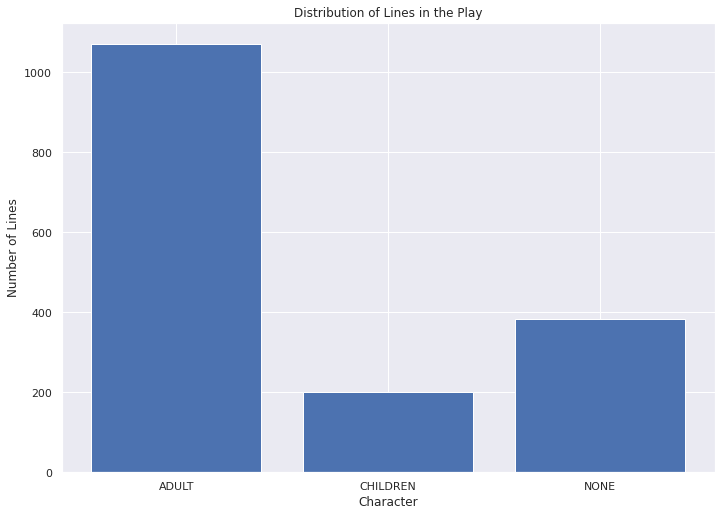

In [69]:
n_class_0 = features[features['character_ac']=='ADULT'].shape[0]
n_class_1 = features[features['character_ac']=='CHILD'].shape[0]
n_class_2 = features[features['character_ac']=='NONE'].shape[0]
x = ['ADULT', 'CHILDREN', 'NONE' ]
y = np.array([n_class_0, n_class_1, n_class_2])
plt.bar(x, y)
plt.xlabel('Character')
plt.ylabel('Number of Lines')
plt.title('Distribution of Lines in the Play')

## Standardization (whole dataset) and data augmentation (training set)

In [70]:
data = features.values[:,:-1]
scalar=StandardScaler()
data = scalar.fit_transform(data)
data = DataFrame(data)
data['character'] = features['character_ac']
data

0         1         2         3         4         5         6  \
0     0.895194 -1.128218 -1.063590 -1.783293  0.768272 -0.633394 -0.793216   
1     0.895194 -1.128218 -1.063590 -1.783293  0.768272 -0.633394 -0.793216   
2     2.856056 -1.128218 -0.848251 -1.783293  0.768272 -0.633394 -0.793216   
3     0.895194 -0.698835 -0.417573 -1.111001 -2.122448 -0.633394 -0.793216   
4    -0.412047 -0.698835 -0.776471 -0.102563 -0.677088  1.578797  1.260691   
...        ...       ...       ...       ...       ...       ...       ...   
1647 -0.030768 -0.269452 -0.178307 -0.102563 -0.436195 -0.633394  1.260691   
1648  1.548815 -0.555707  0.013106 -0.662806  0.768272 -0.633394 -0.793216   
1649  0.148199  0.589314  0.946242 -0.342667  0.768272 -0.633394  1.260691   
1650  1.875625 -0.841963 -0.417573 -1.783293  0.768272 -0.633394 -0.793216   
1651  0.615071 -0.412580 -0.094564 -0.342667 -0.264128 -0.633394  1.260691   

             7         8         9        10        11        12        13  \
0    -0.774097 -1.019562 -0.458537 -0.895280  1.807964 -0.976073 -0.221108   
1    -0.774097 -1.019562 -0.458537 -0.895280  1.807964 -0.976073 -0.221108   
2    -0.774097 -1.019562 -0.458537 -0.895280  1.807964 -0.976073 -0.221108   
3    -0.774097 -1.019562 -0.458537 -0.895280 -0.553108  1.024513 -0.221108   
4     1.291828  0.980814 -0.458537 -0.895280  1.807964 -0.976073 -0.221108   
...        ...       ...       ...       ...       ...       ...       ...   
1647 -0.774097 -1.019562 -0.458537  1.116969 -0.553108  1.024513 -0.221108   
1648  1.291828 -1.019562 -0.458537 -0.895280 -0.553108 -0.976073 -0.221108   
1649 -0.774097 -1.019562 -0.458537  1.116969 -0.553108  1.024513 -0.221108   
1650 -0.774097 -1.019562 -0.458537 -0.895280 -0.553108  1.024513 -0.221108   
1651 -0.774097 -1.019562 -0.458537  1.116969 -0.553108  1.024513 -0.221108   

            14        15        16        17       18        19        20  \
0    -0.687292 -1.308680 -0.636209  0.034816 -0.34641 -0.024611 -0.049266   
1    -0.687292 -1.308680 -0.636209  0.034816 -0.34641 -0.024611 -0.049266   
2    -0.687292 -1.308680 -0.636209  0.034816 -0.34641 -0.024611 -0.049266   
3     1.454985 -1.308680  1.571810  0.034816 -0.34641 -0.024611 -0.049266   
4    -0.687292  0.764129 -0.636209  0.034816 -0.34641 -0.024611 -0.049266   
...        ...       ...       ...       ...      ...       ...       ...   
1647  1.454985  0.764129 -0.636209  0.034816 -0.34641 -0.024611 -0.049266   
1648 -0.687292 -1.308680  1.571810  0.034816 -0.34641 -0.024611 -0.049266   
1649 -0.687292 -1.308680  1.571810  0.034816 -0.34641 -0.024611 -0.049266   
1650 -0.687292 -1.308680  1.571810  0.034816 -0.34641 -0.024611 -0.049266   
1651 -0.687292 -1.308680  1.571810  0.034816 -0.34641 -0.024611 -0.049266   

            21        22        23        24        25        26        27  \
0    -1.413572 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
1    -1.413572 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
2    -1.413572 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
3    -1.413572 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
4     0.707428 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
...        ...       ...       ...       ...       ...       ...       ...   
1647  0.707428 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
1648  0.707428 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
1649 -1.413572 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
1650 -1.413572 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
1651  0.707428 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   

            28        29        30        31        32        33        34  \
0    -0.049266 -0.371135 -0.060375 -0.121417 -0.095724 -0.024611 -0.417288   
1    -0.049266 -0.371135 -0.060375 -0.121417 -0.095724 -0.024611 -0.417288   
2    -0.049266 -0.371135 -0.060375 -0.12141

In [71]:
X_train,X_test,Y_train,Y_test = train_test_split(data.drop(['character'], axis=1),data['character'],test_size=0.30, shuffle=True, stratify = data['character'])
print(X_train.shape, X_test.shape, Y_train.shape, Y_test.shape)

(1156, 1577) (496, 1577) (1156,) (496,)


ADULT 749 64.79%
NONE 267 23.10%
CHILD 140 12.11%


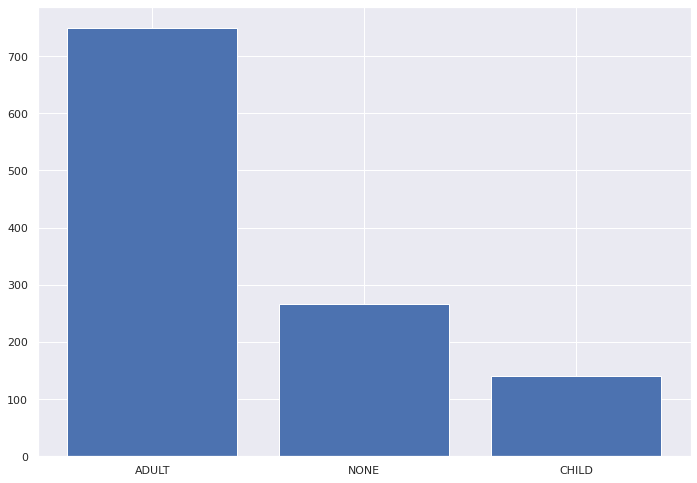

In [72]:
counter = Counter(Y_train) 
for k,v in counter.items():
	per = v / len(Y_train) * 100
	print(k, v, "%.2f" % per+'%')
pyplot.bar(counter.keys(), counter.values())
pyplot.show()

In [73]:
oversample = SMOTE()
X_train_res, Y_train_res = oversample.fit_resample(X_train, Y_train)
print(X_train_res.shape, Y_train_res.shape, X_test.shape, Y_test.shape)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


(2247, 1577) (2247,) (496, 1577) (496,)


ADULT 749 33.33%
NONE 749 33.33%
CHILD 749 33.33%


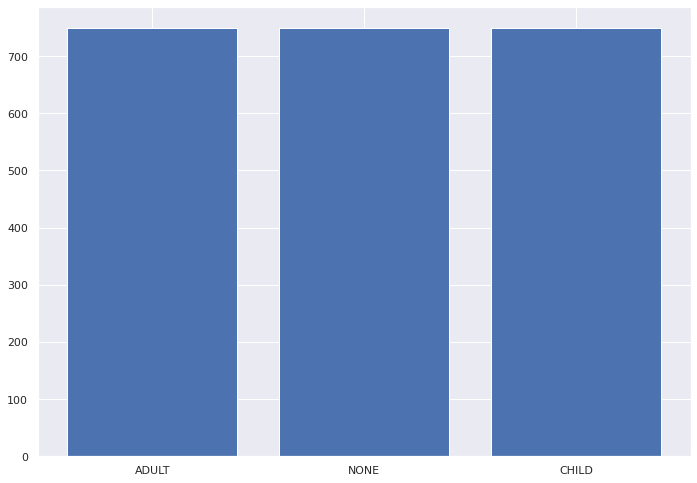

In [74]:
counter = Counter(Y_train_res)
for k,v in counter.items():
	per = v / len(Y_train_res) * 100
	print(k, v, "%.2f" % per+'%')
pyplot.bar(counter.keys(), counter.values())
pyplot.show()

## Classifiers (LogReg, Random Forest, knn, SVC, neural network)

In [75]:
dummy_clf = DummyClassifier(strategy='stratified')
dummy_clf.fit(X_train_res,Y_train_res)
clf_pred = dummy_clf.predict(X_test)
print(classification_report(Y_test, clf_pred))

              precision    recall  f1-score   support

       ADULT       0.69      0.36      0.48       321
       CHILD       0.11      0.30      0.16        60
        NONE       0.26      0.37      0.31       115

    accuracy                           0.36       496
   macro avg       0.35      0.35      0.31       496
weighted avg       0.52      0.36      0.40       496



In [76]:
logmodel = LogisticRegression(multi_class='multinomial', solver='newton-cg', max_iter=100000)
logmodel.fit(X_train_res,Y_train_res)
predictions = logmodel.predict(X_test)
print(classification_report(Y_test,predictions))

              precision    recall  f1-score   support

       ADULT       0.81      0.66      0.73       321
       CHILD       0.21      0.38      0.27        60
        NONE       0.76      0.82      0.79       115

    accuracy                           0.67       496
   macro avg       0.59      0.62      0.60       496
weighted avg       0.72      0.67      0.69       496



Text(0.5, 1.0, 'LogReg confusion matrix')

<Figure size 576x288 with 0 Axes>

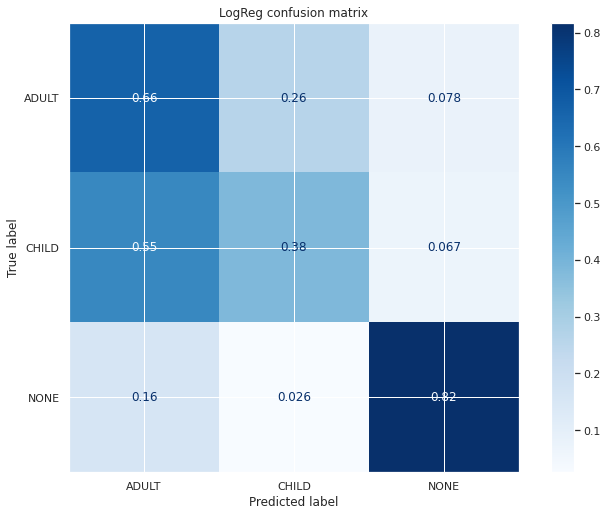

In [77]:
plt.figure(figsize = (8,4))
disp = metrics.plot_confusion_matrix(logmodel, X_test, Y_test, display_labels=None, cmap=plt.cm.Blues, normalize='true')
disp.ax_.set_title('LogReg confusion matrix')

In [78]:
knn = KNeighborsClassifier(n_neighbors=6)

knn.fit(X_train_res, Y_train_res)

pred = knn.predict(X_test)

print(classification_report(Y_test, pred))

              precision    recall  f1-score   support

       ADULT       0.83      0.49      0.61       321
       CHILD       0.18      0.50      0.27        60
        NONE       0.63      0.79      0.70       115

    accuracy                           0.56       496
   macro avg       0.55      0.59      0.53       496
weighted avg       0.70      0.56      0.59       496



In [79]:
clf = svm.SVC(kernel='linear') 
clf.fit(X_train_res, Y_train_res)

y_pred = clf.predict(X_test)
print(classification_report(Y_test, y_pred))

              precision    recall  f1-score   support

       ADULT       0.80      0.70      0.74       321
       CHILD       0.21      0.37      0.27        60
        NONE       0.80      0.78      0.79       115

    accuracy                           0.68       496
   macro avg       0.60      0.62      0.60       496
weighted avg       0.73      0.68      0.70       496



In [80]:
from sklearn.ensemble import RandomForestClassifier

RF_class = RandomForestClassifier(random_state=1)

RF_class.fit(X_train_res, Y_train_res)

y_pred_rf = RF_class.predict(X_test)
print(classification_report(Y_test, y_pred_rf))


              precision    recall  f1-score   support

       ADULT       0.80      0.91      0.85       321
       CHILD       0.19      0.08      0.12        60
        NONE       0.92      0.84      0.88       115

    accuracy                           0.79       496
   macro avg       0.64      0.61      0.62       496
weighted avg       0.75      0.79      0.77       496



In [81]:
featuresNN = data.copy(())
featuresNN

0         1         2         3         4         5         6  \
0     0.895194 -1.128218 -1.063590 -1.783293  0.768272 -0.633394 -0.793216   
1     0.895194 -1.128218 -1.063590 -1.783293  0.768272 -0.633394 -0.793216   
2     2.856056 -1.128218 -0.848251 -1.783293  0.768272 -0.633394 -0.793216   
3     0.895194 -0.698835 -0.417573 -1.111001 -2.122448 -0.633394 -0.793216   
4    -0.412047 -0.698835 -0.776471 -0.102563 -0.677088  1.578797  1.260691   
...        ...       ...       ...       ...       ...       ...       ...   
1647 -0.030768 -0.269452 -0.178307 -0.102563 -0.436195 -0.633394  1.260691   
1648  1.548815 -0.555707  0.013106 -0.662806  0.768272 -0.633394 -0.793216   
1649  0.148199  0.589314  0.946242 -0.342667  0.768272 -0.633394  1.260691   
1650  1.875625 -0.841963 -0.417573 -1.783293  0.768272 -0.633394 -0.793216   
1651  0.615071 -0.412580 -0.094564 -0.342667 -0.264128 -0.633394  1.260691   

             7         8         9        10        11        12        13  \
0    -0.774097 -1.019562 -0.458537 -0.895280  1.807964 -0.976073 -0.221108   
1    -0.774097 -1.019562 -0.458537 -0.895280  1.807964 -0.976073 -0.221108   
2    -0.774097 -1.019562 -0.458537 -0.895280  1.807964 -0.976073 -0.221108   
3    -0.774097 -1.019562 -0.458537 -0.895280 -0.553108  1.024513 -0.221108   
4     1.291828  0.980814 -0.458537 -0.895280  1.807964 -0.976073 -0.221108   
...        ...       ...       ...       ...       ...       ...       ...   
1647 -0.774097 -1.019562 -0.458537  1.116969 -0.553108  1.024513 -0.221108   
1648  1.291828 -1.019562 -0.458537 -0.895280 -0.553108 -0.976073 -0.221108   
1649 -0.774097 -1.019562 -0.458537  1.116969 -0.553108  1.024513 -0.221108   
1650 -0.774097 -1.019562 -0.458537 -0.895280 -0.553108  1.024513 -0.221108   
1651 -0.774097 -1.019562 -0.458537  1.116969 -0.553108  1.024513 -0.221108   

            14        15        16        17       18        19        20  \
0    -0.687292 -1.308680 -0.636209  0.034816 -0.34641 -0.024611 -0.049266   
1    -0.687292 -1.308680 -0.636209  0.034816 -0.34641 -0.024611 -0.049266   
2    -0.687292 -1.308680 -0.636209  0.034816 -0.34641 -0.024611 -0.049266   
3     1.454985 -1.308680  1.571810  0.034816 -0.34641 -0.024611 -0.049266   
4    -0.687292  0.764129 -0.636209  0.034816 -0.34641 -0.024611 -0.049266   
...        ...       ...       ...       ...      ...       ...       ...   
1647  1.454985  0.764129 -0.636209  0.034816 -0.34641 -0.024611 -0.049266   
1648 -0.687292 -1.308680  1.571810  0.034816 -0.34641 -0.024611 -0.049266   
1649 -0.687292 -1.308680  1.571810  0.034816 -0.34641 -0.024611 -0.049266   
1650 -0.687292 -1.308680  1.571810  0.034816 -0.34641 -0.024611 -0.049266   
1651 -0.687292 -1.308680  1.571810  0.034816 -0.34641 -0.024611 -0.049266   

            21        22        23        24        25        26        27  \
0    -1.413572 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
1    -1.413572 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
2    -1.413572 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
3    -1.413572 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
4     0.707428 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
...        ...       ...       ...       ...       ...       ...       ...   
1647  0.707428 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
1648  0.707428 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
1649 -1.413572 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
1650 -1.413572 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   
1651  0.707428 -0.024611 -0.095724 -0.195808 -0.069758 -0.034816 -0.078039   

            28        29        30        31        32        33        34  \
0    -0.049266 -0.371135 -0.060375 -0.121417 -0.095724 -0.024611 -0.417288   
1    -0.049266 -0.371135 -0.060375 -0.121417 -0.095724 -0.024611 -0.417288   
2    -0.049266 -0.371135 -0.060375 -0.12141

In [82]:
X = featuresNN.iloc[:, :-1]
y = featuresNN.iloc[:,-1]

enc = OneHotEncoder()
Y = enc.fit_transform(y[:, np.newaxis]).toarray()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  """


In [83]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, stratify = Y, random_state=4)

n_features = X.shape[1]
n_classes = Y.shape[1]

print(n_features, n_classes)

1577 3


In [84]:
oversample = SMOTE()
X_train_res, Y_train_res = oversample.fit_resample(X_train, Y_train)
print(X_train_res.shape, Y_train_res.shape, X_test.shape, Y_test.shape)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


(2247, 1577) (2247, 3) (496, 1577) (496, 3)


In [85]:
from keras import backend as K

def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

In [86]:
def create_custom_model(input_dim, output_dim, nodes, n=1, name='model'):
    def create_model():
        # Create model
        model = Sequential(name=name)
        for i in range(n):
            model.add(Dense(nodes, input_dim=input_dim, activation='relu'))
        model.add(Dense(output_dim, activation='softmax'))

        # Compile model
        model.compile(loss='categorical_crossentropy', 
                      optimizer='adam', 
                      metrics=['accuracy', f1_m,precision_m, recall_m])
        return model
    return create_model

models = [create_custom_model(n_features, n_classes, 8, i, 'model_{}'.format(i)) 
          for i in range(1, 4)]

for create_model in models:
    create_model().summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_71 (Dense)             (None, 8)                 12624     
_________________________________________________________________
dense_72 (Dense)             (None, 3)                 27        
Total params: 12,651
Trainable params: 12,651
Non-trainable params: 0
_________________________________________________________________
Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_73 (Dense)             (None, 8)                 12624     
_________________________________________________________________
dense_74 (Dense)             (None, 8)                 72        
_________________________________________________________________
dense_75 (Dense)             (None, 3)                 27        
Total params: 12,723
Trainable params:

In [87]:
from keras.callbacks import TensorBoard

history_dict = {}

cb = TensorBoard()

for create_model in models:
    model = create_model()
    print('Model name:', model.name)
    history_callback = model.fit(X_train_res, Y_train_res,
                                 batch_size=5,
                                 epochs=25,
                                 verbose=0,
                                 validation_data=(X_test, Y_test),
                                 callbacks=[cb])
    loss, accuracy, f1_score, precision, recall = model.evaluate(X_test, Y_test, verbose=0)
    print(loss, accuracy, f1_score, precision, recall)
    
    history_dict[model.name] = [history_callback, model]


Model name: model_1
1.8105829954147339 0.6995967626571655 0.6994887590408325 0.7038474082946777 0.6953125
Model name: model_2
1.5049607753753662 0.6915322542190552 0.6902306079864502 0.7148000597953796 0.66796875
Model name: model_3
1.767783522605896 0.711693525314331 0.7103064060211182 0.7158139944076538 0.705078125


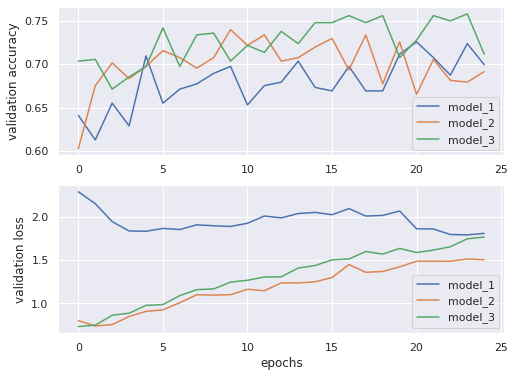

In [88]:
fig, (ax1, ax2) = plt.subplots(2, figsize=(8, 6))

for model_name in history_dict:
    val_accurady = history_dict[model_name][0].history['val_accuracy']
    val_loss = history_dict[model_name][0].history['val_loss']
    ax1.plot(val_accurady, label=model_name)
    ax2.plot(val_loss, label=model_name)
    
ax1.set_ylabel('validation accuracy')
ax2.set_ylabel('validation loss')
ax2.set_xlabel('epochs')
ax1.legend()
ax2.legend();


In [89]:
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import cross_val_score

create_model = create_custom_model(n_features, n_classes, 8, 3)

estimator = KerasClassifier(build_fn=create_model, epochs=100, batch_size=5, verbose=0)
scores = cross_val_score(estimator, X_train_res, Y_train_res, cv=10)
print("Accuracy : {:0.2f} (+/- {:0.2f})".format(scores.mean(), scores.std()))


Accuracy : 0.86 (+/- 0.08)


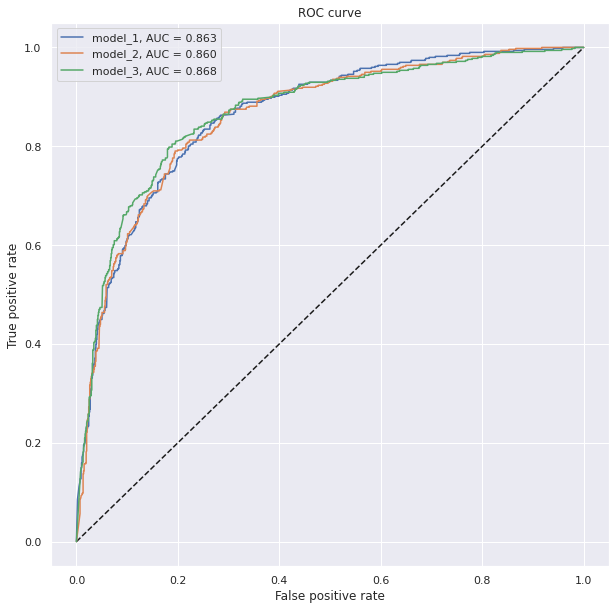

In [90]:
from sklearn.metrics import roc_curve, auc

plt.figure(figsize=(10, 10))
plt.plot([0, 1], [0, 1], 'k--')

for model_name in history_dict:
    model = history_dict[model_name][1]
    
    Y_pred = model.predict(X_test)
    fpr, tpr, threshold = roc_curve(Y_test.ravel(), Y_pred.ravel())
    
    plt.plot(fpr, tpr, label='{}, AUC = {:.3f}'.format(model_name, auc(fpr, tpr)))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend();

## 2d projections with PCA and t-SNE

In [91]:
df_graf = featuresNN
y = df_graf.iloc[:,-1]

In [92]:
np.random.seed(42)
rndperm = np.random.permutation(df_graf.shape[0])

In [93]:
pca = PCA(n_components=3)
pca_result = pca.fit_transform(df_graf.iloc[:,:-1].values)
df_graf['pca-one'] = pca_result[:,0]
df_graf['pca-two'] = pca_result[:,1] 
df_graf['pca-three'] = pca_result[:,2]
print('Explained variation per principal component: {}'.format(pca.explained_variance_ratio_))

Explained variation per principal component: [0.02332483 0.01240692 0.01060922]


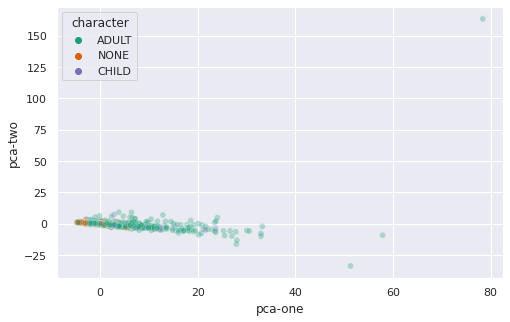

In [94]:
plt.figure(figsize=(8,5))
sns.scatterplot(
    x="pca-one", 
    y="pca-two",
    hue = 'character',
    palette=sns.color_palette('Dark2',3),
    data=df_graf.loc[rndperm,:],
    legend="full",
    alpha=0.3
)

In [97]:
df_tsne = features.copy()
df_tsne["character_num"] = [1 if ele  == "ADULT" else 2 if ele == 'CHILD' else 3 for ele in df_tsne["character_ac"]]
df_tsne = df_tsne.drop(['character_ac'], axis=1)
df_tsne_f = df_tsne.iloc[:,:-2]
df_tsne_t = df_tsne.iloc[:,-1]

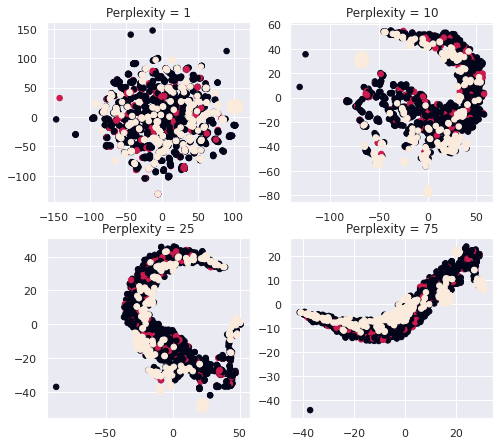

In [98]:
plt.figure(figsize = (8,4))
plt.subplots_adjust(top = 1.5)

for index, p in enumerate([1, 10, 25, 75]):

    tsne = TSNE(n_components = 2, perplexity = p, random_state=10)
    tsne_results = tsne.fit_transform(df_tsne_f)
    
    tsne_results=pd.DataFrame(tsne_results, columns=['tsne1', 'tsne2'])
    
    plt.subplot(2,2,index+1)
    plt.scatter(tsne_results['tsne1'], tsne_results['tsne2'], c=df_tsne_t, s=30)
    plt.title('Perplexity = '+ str(p))
plt.show()

## Visual representation of different features

In [99]:
df_grafici = features.copy()
df_grafici.head()

,avg_word_length,avg_sent_length,avg_sent_length_char,prop_stopwords,typetoken_ratio,ADJ,ADP,ADV,AUX,CCONJ,DET,INTJ,NOUN,NUM,PART,PRON,PROPN,PUNCT,SCONJ,SPACE,SYM,VERB,X,"(ADJ, ADJ)","(ADJ, ADP)","(ADJ, ADV)","(ADJ, AUX)","(ADJ, CCONJ)","(ADJ, DET)","(ADJ, NOUN)","(ADJ, NUM)","(ADJ, PART)","(ADJ, PRON)","(ADJ, PROPN)","(ADJ, PUNCT)","(ADJ, SCONJ)","(ADJ, SYM)","(ADJ, VERB)","(ADP, ADJ)","(ADP, ADP)","(ADP, ADV)","(ADP, AUX)","(ADP, CCONJ)","(ADP, DET)","(ADP, NOUN)","(ADP, NUM)","(ADP, PART)","(ADP, PRON)","(ADP, PROPN)","(ADP, PUNCT)","(ADP, SCONJ)","(ADP, VERB)","(ADV, ADJ)","(ADV, ADP)","(ADV, ADV)","(ADV, AUX)","(ADV, CCONJ)","(ADV, DET)","(ADV, NOUN)","(ADV, NUM)","(ADV, PART)","(ADV, PRON)","(ADV, PROPN)","(ADV, PUNCT)","(ADV, SCONJ)","(ADV, SYM)","(ADV, VERB)","(AUX, ADJ)","(AUX, ADP)","(AUX, ADV)","(AUX, AUX)","(AUX, CCONJ)","(AUX, DET)","(AUX, INTJ)","(AUX, NOUN)","(AUX, NUM)","(AUX, PART)","(AUX, PRON)","(AUX, PROPN)","(AUX, PUNCT)","(AUX, SCONJ)","(AUX, VERB)","(CCONJ, ADJ)","(CCONJ, ADP)","(CCONJ, ADV)","(CCONJ, AUX)","(CCONJ, DET)","(CCONJ, INTJ)","(CCONJ, NOUN)","(CCONJ, PART)","(CCONJ, PRON)","(CCONJ, PROPN)","(CCONJ, PUNCT)","(CCONJ, SCONJ)","(CCONJ, VERB)","(DET, ADJ)","(DET, ADP)","(DET, ADV)","(DET, AUX)","(DET, CCONJ)","(DET, DET)","(DET, INTJ)","(DET, NOUN)","(DET, NUM)","(DET, PRON)","(DET, PROPN)","(DET, PUNCT)","(DET, SCONJ)","(DET, VERB)","(INTJ, ADJ)","(INTJ, ADV)","(INTJ, AUX)","(INTJ, CCONJ)","(INTJ, DET)","(INTJ, INTJ)","(INTJ, NOUN)","(INTJ, PRON)","(INTJ, PROPN)","(INTJ, PUNCT)","(INTJ, SCONJ)","(INTJ, VERB)","(NOUN, ADJ)","(NOUN, ADP)","(NOUN, ADV)","(NOUN, AUX)","(NOUN, CCONJ)","(NOUN, DET)","(NOUN, INTJ)","(NOUN, NOUN)","(NOUN, PART)","(NOUN, PRON)","(NOUN, PROPN)","(NOUN, PUNCT)","(NOUN, SCONJ)","(NOUN, SYM)","(NOUN, VERB)","(NUM, ADJ)","(NUM, ADP)","(NUM, ADV)","(NUM, CCONJ)","(NUM, DET)","(NUM, NOUN)","(NUM, PART)","(NUM, PUNCT)","(NUM, VERB)","(PART, ADJ)","(PART, ADP)","(PART, ADV)","(PART, AUX)","(PART, DET)","(PART, NOUN)","(PART, NUM)","(PART, PART)","(PART, PRON)","(PART, PROPN)","(PART, PUNCT)","(PART, SCONJ)","(PART, SPACE)","(PART, VERB)","(PRON, ADJ)","(PRON, ADP)","(PRON, ADV)","(PRON, AUX)","(PRON, CCONJ)","(PRON, DET)","(PRON, INTJ)","(PRON, NOUN)","(PRON, NUM)","(PRON, PART)","(PRON, PRON)","(PRON, PROPN)","(PRON, PUNCT)","(PRON, SCONJ)","(PRON, VERB)","(PROPN, ADJ)","(PROPN, ADP)","(PROPN, ADV)","(PROPN, AUX)","(PROPN, CCONJ)","(PROPN, DET)","(PROPN, NOUN)","(PROPN, PART)","(PROPN, PRON)","(PROPN, PROPN)","(PROPN, PUNCT)","(PROPN, SCONJ)","(PROPN, SYM)","(PROPN, VERB)","(PUNCT, ADJ)","(PUNCT, ADP)","(PUNCT, ADV)","(PUNCT, AUX)","(PUNCT, CCONJ)","(PUNCT, DET)","(PUNCT, INTJ)","(PUNCT, NOUN)","(PUNCT, NUM)","(PUNCT, PART)","(PUNCT, PRON)","(PUNCT, PROPN)","(PUNCT, PUNCT)","(PUNCT, SCONJ)","(PUNCT, VERB)","(PUNCT, X)","(SCONJ, ADJ)","(SCONJ, ADP)","(SCONJ, ADV)","(SCONJ, DET)","(SCONJ, NOUN)","(SCONJ, NUM)","(SCONJ, PART)","(SCONJ, PRON)","(SCONJ, PROPN)","(SCONJ, PUNCT)","(SCONJ, SCONJ)","(SPACE, VERB)","(SYM, NOUN)","(SYM, PROPN)","(VERB, ADJ)","(VERB, ADP)","(VERB, ADV)","(VERB, AUX)","(VERB, CCONJ)","(VERB, DET)","(VERB, INTJ)","(VERB, NOUN)","(VERB, NUM)","(VERB, PART)","(VERB, PRON)","(VERB, PROPN)","(VERB, PUNCT)","(VERB, SCONJ)","(VERB, VERB)","(X, PUNCT)","(ADJ, ADJ, NOUN)","(ADJ, ADJ, PUNCT)","(ADJ, ADP, ADJ)","(ADJ, ADP, ADP)","(ADJ, ADP, ADV)","(ADJ, ADP, DET)","(ADJ, ADP, NOUN)","(ADJ, ADP, NUM)","(ADJ, ADP, PRON)","(ADJ, ADP, PROPN)","(ADJ, ADP, PUNCT)","(ADJ, ADP, VERB)","(ADJ, ADV, ADJ)","(ADJ, ADV, PRON)","(ADJ, ADV, PUNCT)","(ADJ, AUX, PART)","(ADJ, AUX, PRON)","(ADJ, CCONJ, ADJ)","(ADJ, CCONJ, DET)","(ADJ, CCONJ, PRON)","(ADJ, CCONJ, VERB)","(ADJ, DET, AUX)","(ADJ, DET, DET)","(ADJ, DET, NOUN)","(ADJ, NOUN, ADJ)","(ADJ, NOUN, ADP)","(ADJ, NOUN, ADV)","(ADJ, NOUN, AUX)","(ADJ, NOUN, CCONJ)","(ADJ, NOUN, DET)","(ADJ, NOUN, NOUN)","(ADJ, NOUN, PART)","(ADJ, NOUN, PRON)","(ADJ, NOUN, PUNCT)","(ADJ, NOUN, SCONJ)","(ADJ, NOUN, VERB)","(ADJ, NUM, ADP)","(ADJ, NUM, NO

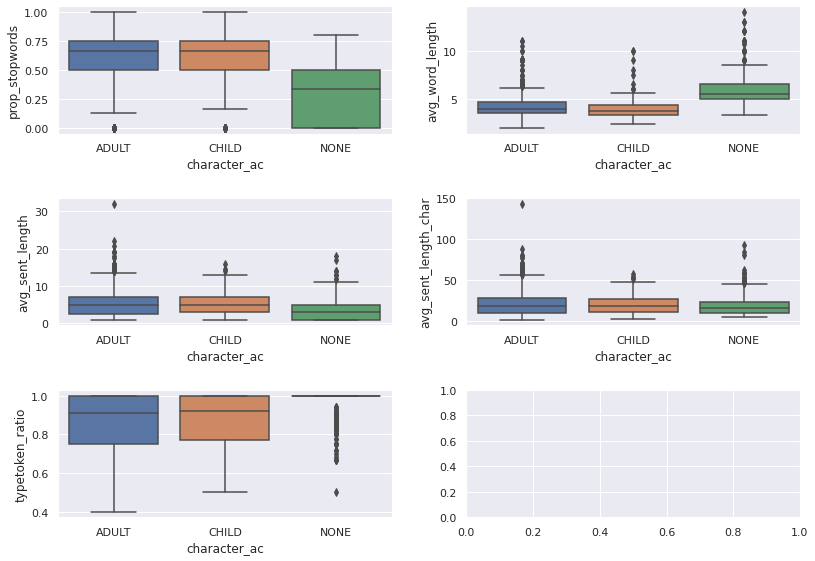

In [100]:
sns.set(rc={'figure.figsize':(11.7,8.27)})

fig, axs = plt.subplots(3,2)

fn = ['prop_stopwords', 'avg_word_length', 'avg_sent_length', 'avg_sent_length_char', 'typetoken_ratio']
cn = ['ADULT', 'CHILD', 'NONE']
sns.boxplot(x = 'character_ac', y = 'prop_stopwords', data = df_grafici, order = cn, ax = axs[0,0]);
sns.boxplot(x = 'character_ac', y = 'avg_word_length', data = df_grafici, order = cn, ax = axs[0,1]);
sns.boxplot(x = 'character_ac', y = 'avg_sent_length', data = df_grafici, order = cn, ax = axs[1,0]);
sns.boxplot(x = 'character_ac', y = 'avg_sent_length_char', data = df_grafici,  order = cn, ax = axs[1,1]);
sns.boxplot(x = 'character_ac', y = 'typetoken_ratio', data = df_grafici,  order = cn, ax = axs[2,0]);
fig.tight_layout(pad=2.0);

In [101]:
df_grafici = df_grafici.loc[df_grafici.character_ac.isin(['ADULT', 'CHILD'])]

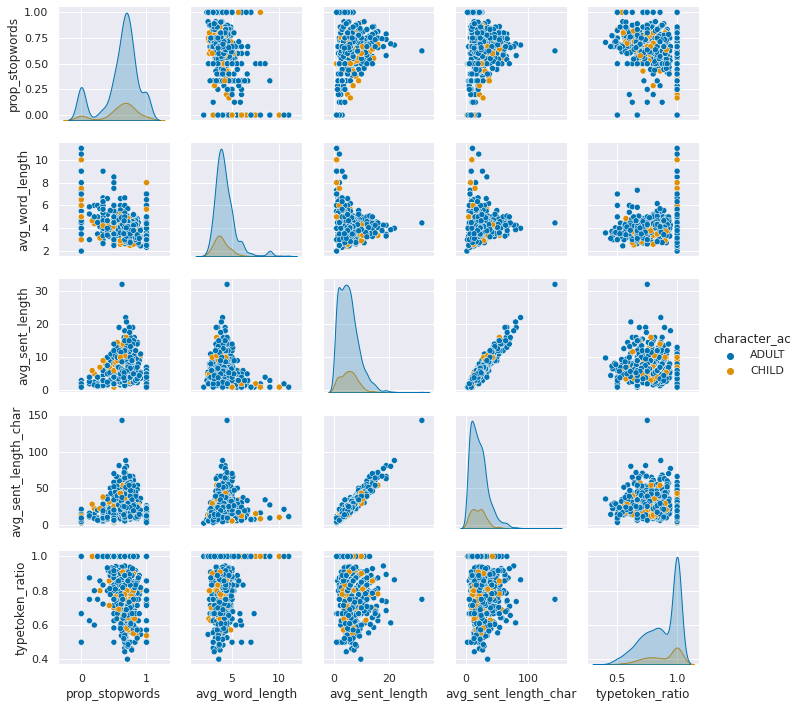

In [102]:
sns.pairplot(df_grafici[['prop_stopwords', 'avg_word_length', 'avg_sent_length', 'avg_sent_length_char', 'typetoken_ratio', 'character_ac']], hue='character_ac', height = 2, palette = 'colorblind')